In [1]:
import sys
sys.path.append('/raven/u/ajagadish/vanilla-llama/categorisation/')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
FONTSIZE=20

In [2]:
# set plotting parameters
COLORS = {'a':'#117733', 
          'b':'#96CAA7',
          'lr':'#88CCEE',#882255
          'svm':'#CC6677',
          'optimal': '#D6BF4D',
          'feature_1':'#882255', #332288
          'people':'#882255', #AA4499',
          'stats':'#44AA99', 
          'feature_2':'#44AA99',
          'simple_grammar_constrained_noncompositonal':'#EF9EBB',
          'feature_3':'#E2C294', #'#0571D0', 
          'metal':'#DA9138', #"#D55E00", 
          'people2': '#748995',
          'metal2': '#173b4f'
          }
FONTSIZE=20

In [20]:
data = pd.read_csv('../data/claude_generated_tasks_paramsNA_dim3_data100_tasks4000_pversion4.csv')
data.input = data['input'].apply(lambda x: np.array(eval(x)))

In [21]:
data = data.groupby(['task_id']).filter(lambda x: len(x['trial_id'])>200)
data.task_id.unique()

array([  59.,  128.,  130.,  141.,  146.,  165.,  185.,  205.,  254.,
        277.,  293.,  303.,  328.,  331.,  332.,  499.,  697.,  727.,
        837.,  863.,  931.,  956.,  993., 1019., 1092., 1142., 1148.,
       1402., 1410., 1417., 1531.])

In [38]:
task_id = 128

In [51]:
data[data.task_id==task_id]

,Unnamed: 0,Unnamed: 0.1,input,target,trial_id,task_id
10994,10994,10994,"[299.0, 152.0, 204.0]",golfclubs,0,128.0
10995,10995,10995,"[298.0, 153.0, 205.0]",golfclubs,1,128.0
10996,10996,10996,"[297.0, 154.0, 206.0]",golfclubs,2,128.0
10997,10997,10997,"[296.0, 155.0, 207.0]",golfclubs,3,128.0
10998,10998,10998,"[295.0, 156.0, 208.0]",golfclubs,4,128.0
...,...,...,...,...,...,...
11288,11288,11288,"[5.0, 446.0, 498.0]",tennisgear,294,128.0
11289,11289,11289,"[4.0, 447.0, 499.0]",tennisgear,295,128.0
11290,11290,11290,"[3.0, 448.0, 500.0]",tennisgear,296,128.0
11291,11291,11291,"[2.0, 449.0, 501.0]",tennisgear,297,128.0


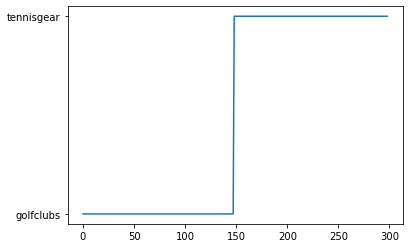

In [42]:
plt.plot(data[data.task_id==task_id].target.values)

In [43]:
aa = np.stack(data[data.task_id==task_id].input.to_numpy())

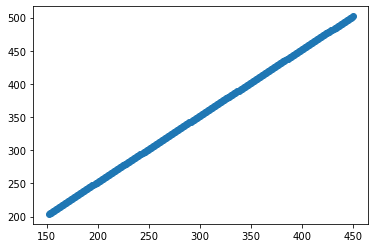

In [44]:
plt.scatter(aa[:, 1], aa[:, 2])

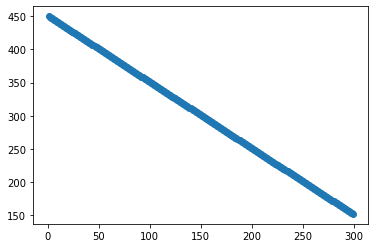

In [46]:
plt.scatter(aa[:, 0], aa[:, 1])

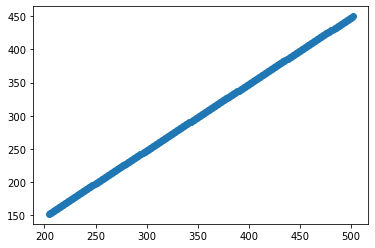

In [47]:
plt.scatter(aa[:, 2], aa[:, 1])

In [56]:
data.input = data['input'].apply(lambda x: np.array(eval(x)))

In [17]:
df = pd.read_csv('../data/tasklabels/claude_generated_tasklabels_paramsNA_dim3_tasks23426_pversion5.csv')
# df.feature_names = df['feature_names'].apply(lambda x: eval(x))
# df.category_names = df['category_names'].apply(lambda x: eval(x))

In [19]:
df.feature_names[0]

"['brightness', 'saturation', 'hue']"

In [16]:
# df.to_csv(f'claude_generated_tasklabels_paramsNA_dim3_tasks23426_pversion5.csv')             

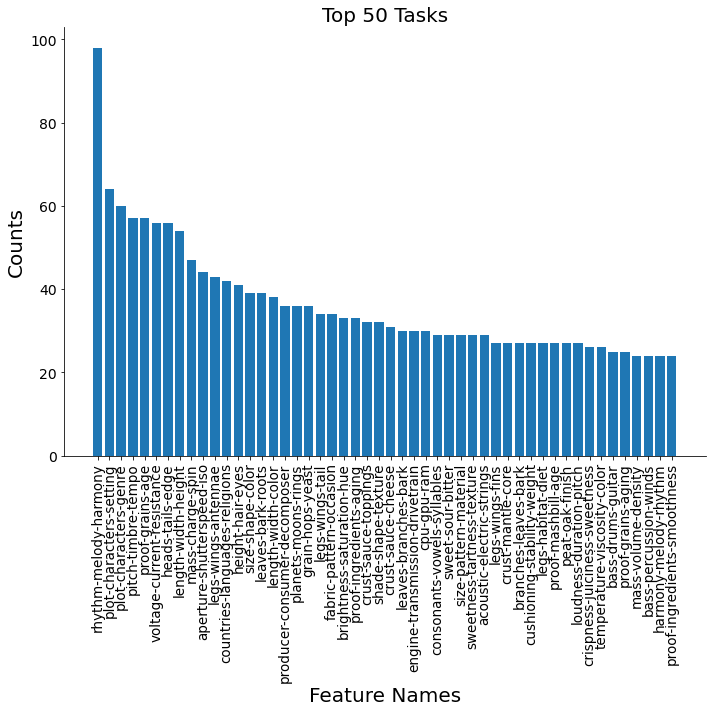

In [ ]:
from collections import Counter

df = pd.read_csv('../data/tasklabels/claude_generated_tasklabels_paramsNA_dim3_tasks23426_pversion5.csv')
df.feature_names = df['feature_names'].apply(lambda x: eval(x))
def to_lower(ff):
    return [x.lower() for x in ff]
df.feature_names = df['feature_names'].apply(lambda x: to_lower(x))

# count of number of times a type of features occurs
list_counts = Counter([tuple(features) for features in df['feature_names']])

# sort the Counter by counts in descending order
sorted_list_counts = sorted(list_counts.items(), key=lambda x: x[1], reverse=True)

# extract the counts and names for the top 50 labels
top_labels = 50
task_labels = np.array([task_label[0] for task_label in sorted_list_counts[:top_labels]])
label_counts= np.array([task_label[1] for task_label in sorted_list_counts[:top_labels]])
label_names = ['-'.join(task_labels[idx]) for idx in range(len(task_labels))]

# plot the bars of labels and counts
f, ax = plt.subplots(1, 1, figsize=(10,10))
ax.bar(label_names, label_counts)
plt.xticks(label_names, label_names, rotation=90, fontsize=FONTSIZE-6.5)
plt.yticks(fontsize=FONTSIZE-6)
ax.set_xlabel('Feature Names', fontsize=FONTSIZE)
ax.set_ylabel('Counts', fontsize=FONTSIZE)
ax.set_title(f'Top {top_labels} Tasks', fontsize=FONTSIZE)
sns.despine()
f.tight_layout()
plt.show()

### number of tasks with more than 2 categorical values for at least one feature

In [44]:
df = pd.read_csv('../data/claude_generated_tasks_paramsNA_dim3_data100_tasks500_pversion3.csv')

cats = []
num_tasks=500
num_features=3
max_variables=2

for task_idx in range(num_tasks): #df.task_id.max()):
    for feat in range(num_features):
        arrs = np.array([eval(feature) for feature in df[df.task_id==task_idx].input.values])[:, feat]
        tt, pp = [], []
        for _, arr in enumerate(arrs):
            try:
                tt.append(eval(arr))
            except:
                pp.append(arr)
        if len(pp)>1:
            if len(np.unique(np.stack(pp)))>max_variables:
                cats.append([task_idx])

In [45]:
np.unique(np.stack(cats)).shape[0], np.unique(np.stack(cats)).shape[0]/num_tasks

(258, 0.516)

In [44]:
df = None
last_task_id = 0
n_runs = 100
for run_id in range(100):
    try:
        data = pd.read_csv(f'../data/tasklabels/claude_generated_tasklabels_paramsNA_dim3_tasks250_run{run_id}_procid0_pversion5.csv')
        df = pd.DataFrame({'feature_names': data.feature_names.values, 'category_names': data.category_names.values, 'task_id': data.task_id.values}) \
        if df is None else pd.concat([df, pd.DataFrame({'feature_names': data.feature_names.values, 'category_names': data.category_names.values, 'task_id': data.task_id.values+last_task_id})], ignore_index=True)
        last_task_id = df.task_id.values[-1]         
    except:
        print(run_id)                

36
39
55


In [45]:
df

,feature_names,category_names,task_id
0,"['brightness', 'saturation', 'hue']","['fruits', 'vegetables']",0
1,"['length', 'width', 'height']","['books', 'movies']",1
2,"['temperature', 'pressure', 'volume']","['gases', 'liquids']",2
3,"['legs', 'wings', 'fins']","['mammals', 'birds']",3
4,"['sodium', 'fat', 'protein']","['healthyfoods', 'unhealthyfoods']",4
...,...,...,...
23071,"['plot', 'characters', 'genre']","['mysteries', 'thrillers']",22975
23072,"['silver', 'gold', 'copper']","['bracelets', 'rings']",22976
23073,"['bass', 'percussion', 'brass']","['marchingbands', 'drumcorps']",22977
23074,"['distortion', 'chorus', 'flanger']","['rock', 'psychedelic']",22978


In [ ]:
data = pd.read_csv('../data/claude_generated_tasks_paramsNA_dim3_data100_tasks14000.csv')
#gpt4_generated_tasks_paramsNA_dim3_data100_tasks30.csv')
data = data.query('target == "A" or target == "B"')

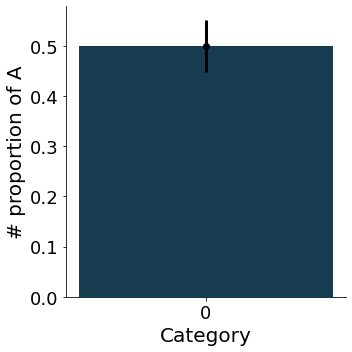

In [3]:
num_tasks = int(data.task_id.max()+1)
f, ax = plt.subplots(1, 1, figsize=(5,5))
bar_positions = [0] #, 0.55]
colors = ['#173b4f', '#8b9da7']
props = np.stack([(data[data.task_id==task_id].target=='A').sum()/len(data[data.task_id==task_id].target) for task_id in data.task_id.unique()[:100]])
ax.bar(bar_positions, props.mean(), color=colors, width=0.1)
ax.errorbar(bar_positions, props.mean(), yerr=props.std(),  c='k', lw=3, fmt="o") #/np.sqrt(len(props)-1)
ax.set_ylabel('# proportion of A', fontsize=FONTSIZE)
ax.set_xlabel('Category', fontsize=FONTSIZE) 
ax.set_xticks(bar_positions) 
plt.xticks(fontsize=FONTSIZE-2)
plt.yticks(fontsize=FONTSIZE-2)
sns.despine()
f.tight_layout()
plt.show()

In [4]:
start_task = 9950
end_task = start_task + 1
data_subselcted = data.query(f'task_id >= {start_task} and task_id < {end_task}')#.target.values

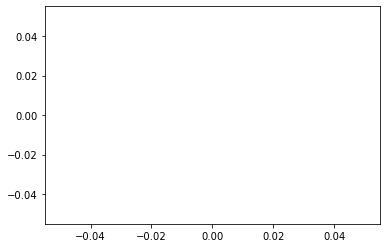

In [5]:
for task_id in np.arange(start_task, end_task):
    plt.plot(data_subselcted[data_subselcted.task_id==task_id].target.values)

In [6]:
def longest_consecutive_sequence(arr):
    return np.median(np.diff(np.insert(np.where(np.diff(arr) != 0)[0] + 1, [0, -1], [0, len(arr)])))/len(arr)

In [9]:
num_tasks=1000
list_tasks = data.task_id.unique()[:num_tasks] 
data_subselcted = data[data['task_id'].isin(list_tasks)]
burstinesss, shuffled_baselines, block_length, shuffled_block_length  = [], [], [], []
for task_id in list_tasks:
    data_As = data_subselcted[data_subselcted.task_id==task_id].target.values
    signal = np.stack([2. if val=='A' else 1. for val in data_As])
    burstinesss.append((len(signal)-(np.diff(signal)==0).sum())/len(signal))
    block_length.append(longest_consecutive_sequence(signal))
    np.random.shuffle(signal)
    shuffled_baselines.append((len(signal)-(np.diff(signal)==0).sum())/len(signal))
    shuffled_block_length.append(longest_consecutive_sequence(signal))

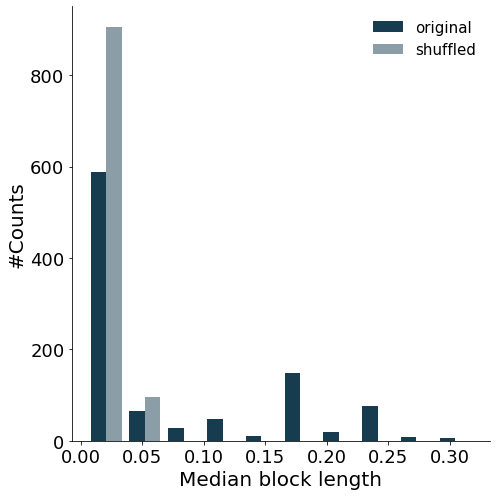

In [10]:
categories = ['original', 'shuffled']
f, ax = plt.subplots(1, 1, figsize=(7,7))
colors = ['#173b4f', '#8b9da7'] 
a = plt.hist([np.stack(block_length), np.stack(shuffled_block_length)], bins=10, color=colors, label=categories);
ax.set_ylabel('#Counts', fontsize=FONTSIZE)
ax.set_xlabel('Median block length', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE-2)
plt.yticks(fontsize=FONTSIZE-2)
plt.legend(frameon=False, fontsize=FONTSIZE-5)
sns.despine()
f.tight_layout()
plt.show()

In [11]:
a[0][:, 1:].sum(1), a[0][:, :1].sum(1)

(array([412.,  95.]), array([588., 905.]))

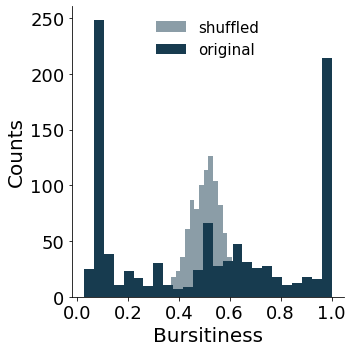

In [12]:
categories = ['original', 'shuffled']
f, ax = plt.subplots(1, 1, figsize=(5,5))
bar_positions = [0, 0.55]
colors = ['#173b4f', '#8b9da7'] #'#748995', '#5d7684', '#456272', '#2e4f61', 
ax.hist(np.stack(shuffled_baselines), bins=25, density=False, color=colors[1], label=categories[1])
ax.hist(np.stack(burstinesss), bins=25, density=False, color=colors[0], label=categories[0])
ax.set_ylabel('Counts', fontsize=FONTSIZE)
ax.set_xlabel('Bursitiness', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE-2)
plt.yticks(fontsize=FONTSIZE-2)
plt.legend(frameon=False, fontsize=FONTSIZE-5)
sns.despine()
f.tight_layout()
plt.show()

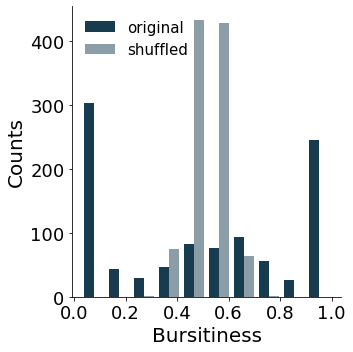

In [13]:
categories = ['original', 'shuffled']
f, ax = plt.subplots(1, 1, figsize=(5,5))
bar_positions = [0, 0.55]
colors = ['#173b4f', '#8b9da7'] #'#748995', '#5d7684', '#456272', '#2e4f61', 
ax.hist([np.stack(burstinesss), np.stack(shuffled_baselines)], density=False, color=colors, label=categories)
ax.set_ylabel('Counts', fontsize=FONTSIZE)
ax.set_xlabel('Bursitiness', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE-2)
plt.yticks(fontsize=FONTSIZE-2)
plt.legend(frameon=False, fontsize=FONTSIZE-5, loc='upper left')
sns.despine()
f.tight_layout()
plt.show()

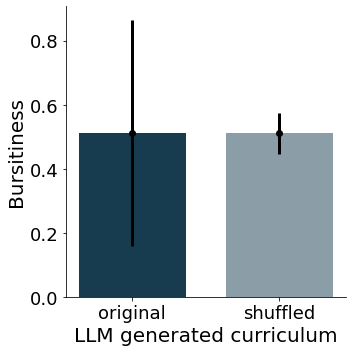

In [14]:
# plot the fourier transform coefficients of the signal
categories = ['original', 'shuffled']
f, ax = plt.subplots(1, 1, figsize=(5,5))
bar_positions = [0, 0.55]
colors = ['#173b4f', '#8b9da7'] #'#748995', '#5d7684', '#456272', '#2e4f61',   
ax.bar(bar_positions, [np.array(burstinesss).mean(),np.array(shuffled_baselines).mean()], color=colors, width=0.4)
ax.errorbar(bar_positions, [np.array(burstinesss).mean(),np.array(shuffled_baselines).mean()],\
            yerr=[np.array(burstinesss).std(), np.array(shuffled_baselines).std()], \
            c='k', lw=3, fmt="o") #/np.sqrt(num_tasks-1)
ax.set_xlabel('LLM generated curriculum', fontsize=FONTSIZE)
ax.set_ylabel('Bursitiness', fontsize=FONTSIZE)
ax.set_xticks(bar_positions)  # Set x-tick positions to bar_positions
ax.set_xticklabels(categories, fontsize=FONTSIZE-2)  # Assign category names to x-tick labels
plt.xticks(fontsize=FONTSIZE-2)
plt.yticks(fontsize=FONTSIZE-2)
sns.despine()
f.tight_layout()
plt.show()

In [59]:
list_tasks = [9, 13, 17, 20]
data_subselcted = data[data['task_id'].isin(list_tasks)]
for task_id in list_tasks:
    data_As = data_subselcted[data_subselcted.task_id==task_id].target.values
    signal = np.stack([2. if val=='A' else 1. for val in data_As])
    print(f"burstiness: {(len(signal)-(np.diff(signal)==0).sum())/len(signal)}")

burstiness: 0.23214285714285715
burstiness: 0.125
burstiness: 0.125
burstiness: 0.08823529411764706


## Fourier Tranform

In [94]:
def plot_fourier_transform_coefficients(signal):
    # plot the fourier transform coefficients of the signal
    f, ax = plt.subplots(1, 1, figsize=(5,5))
    ax.plot(np.arange(len(signal)), np.abs(np.fft.fft(signal))**2, lw=3)
    ax.set_xlabel('Frequency', fontsize=FONTSIZE)
    ax.set_ylabel('Magnitude', fontsize=FONTSIZE)
    plt.xticks(fontsize=FONTSIZE-2)
    plt.yticks(fontsize=FONTSIZE-2)
    sns.despine()
    f.tight_layout()
    plt.show()

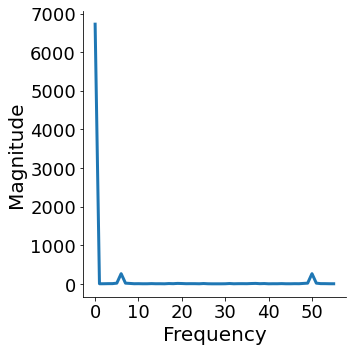

In [152]:
plot_fourier_transform_coefficients(signal)

In [129]:
x = signal
# FFT
X = np.fft.fft(x)
frequencies = np.fft.fftfreq(len(X), 1/len(X))

# Power spectrum
power = np.abs(X)**2

# Define threshold for low and high frequencies
threshold = len(X)/10  # Hz
low_power = np.sum(power[frequencies < threshold])
high_power = np.sum(power[frequencies >= threshold])

print(f"Low Frequency Power: {low_power}")
print(f"High Frequency Power: {high_power}")
low_power/high_power

Low Frequency Power: 2113.893942506324
High Frequency Power: 735.1060574936761


2.875631238455016

In [221]:
def adjust_color_intensity(color, position, total_positions):
    factor = position / total_positions
    r, g, b = color
    return (r * factor, g * factor, b * factor)

In [228]:
task_id = 9
xyz = np.stack([eval(val) for val in data[data.task_id==task_id].input.values])
categories = data[data.task_id==task_id].target.values

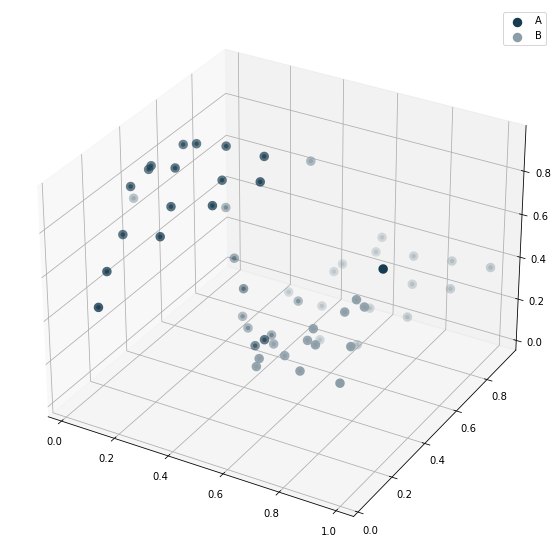

In [229]:
# Example data
x = xyz[:,0]
y = xyz[:,1]
z = xyz[:,2]
categories = categories
temporal=False

# Create a colormap
base_colors = {'A': (1, 0, 0), 'B': (0, 0, 1)}  # RGB for red, green, blue
labels = np.array([adjust_color_intensity(base_colors[cat], i, len(categories)) for i, cat in enumerate(categories)])
intensities = np.linspace(0, 1, len(x))
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

for category, color in base_colors.items():
    mask = categories == category
    if temporal:
        ax.scatter(x[mask], y[mask], z[mask], c=intensities[mask], cmap='viridis_r', label=category, lw=5)
    else:
        ax.scatter(x[mask], y[mask], z[mask], c=colors[0] if category =='A' else colors[1], label=category, lw=5)
        ax.legend()
plt.show()

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:317: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /home/abuild/rpmbuild/BUILD/pytorch-1.13.0/torch/csrc/utils/tensor_new.cpp:230.)
  baseline_model_choices.append(torch.tensor([lr_model_choice, svm_model_choice]))


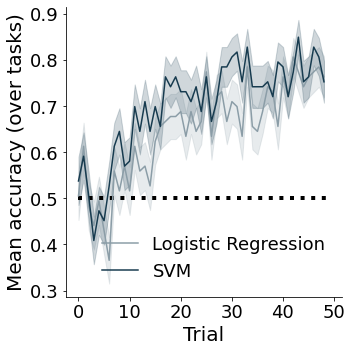

In [4]:
data = data.query('task_id >= 100 and task_id <= 200')
from plots import plot_trial_by_trial_performance
min_trials=50
burn_in=1
plot_trials = min_trials-burn_in
df = data.groupby('task_id').filter(lambda x: len(x)>=min_trials)
# keep only min_trials for all tasks for model fitting
data = data[data.trial_id<=min_trials]
plot_trial_by_trial_performance(df, burn_in, plot_trials, min_trials)

In [5]:
data

,Unnamed: 0,Unnamed: 0.1,input,target,trial_id,task_id
6485,6485,6485,"[0.23, 0.76, 0.48]",A,0,100.0
6486,6486,6486,"[0.12, 0.33, 0.62]",A,1,100.0
6487,6487,6487,"[0.45, 0.21, 0.37]",A,2,100.0
6488,6488,6488,"[0.68, 0.52, 0.81]",B,3,100.0
6489,6489,6489,"[0.94, 0.15, 0.29]",B,4,100.0
...,...,...,...,...,...,...
13106,13106,13106,"[0.63, 0.74, 0.24]",A,46,200.0
13107,13107,13107,"[0.14, 0.42, 0.83]",B,47,200.0
13108,13108,13108,"[0.34, 0.61, 0.51]",A,48,200.0
13109,13109,13109,"[0.92, 0.13, 0.72]",B,49,200.0


mean:  66.8481934208161


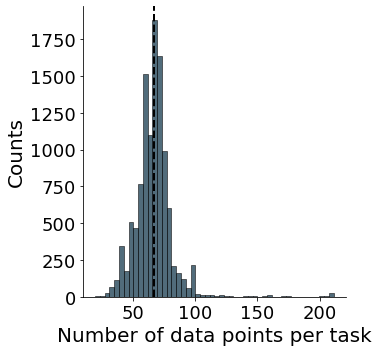

In [6]:
from plots import plot_mean_number_tasks
plot_mean_number_tasks(data)

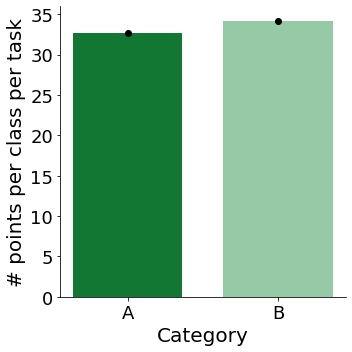

In [5]:
from plots import label_imbalance
label_imbalance(data)

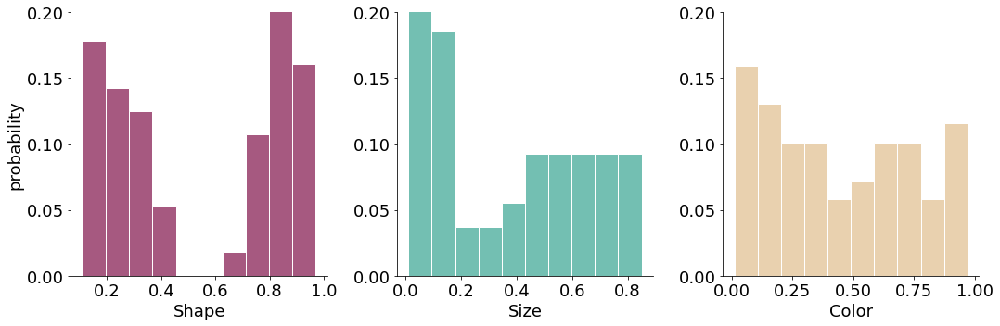

In [4]:
task1 = [3302, 7215, 3350]
task2 = [10763, 7215, 387, 978]
task3 = [10763, 4060, 3639, 5950]

from plots import plot_per_task_features_for_selected_tasks
plot_per_task_features_for_selected_tasks(data, sample_task_per_feature=[3302, 10763, 3639])

[3537. 5898. 7376. 7988. 1146.]


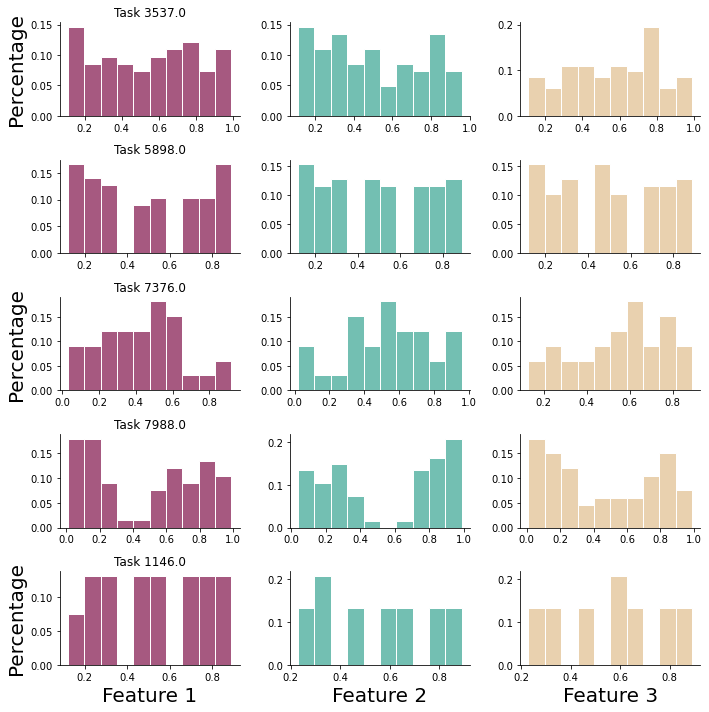

In [22]:
from plots import plot_per_task_features
plot_per_task_features(data)

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


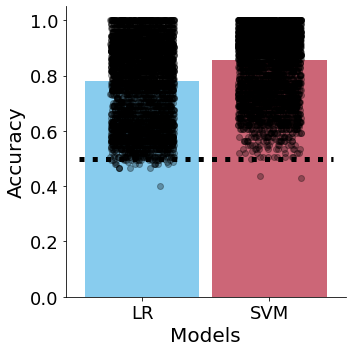

In [4]:
from plots import compare_llm_uniform_data_samples
random=False
min_trials=70
df = data.groupby('task_id').filter(lambda x: len(x) >= min_trials)
df = df[df.trial_id<=min_trials]
compare_llm_uniform_data_samples(df, random)

In [ ]:
from plots import plot_trial_by_trial_performance
min_trials=50
burn_in=1
plot_trials = min_trials-burn_in
df = data.groupby('task_id').filter(lambda x: len(x) >= min_trials)
plot_trial_by_trial_performance(df, burn_in, plot_trials, min_trials)

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:317: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /home/abuild/rpmbuild/BUILD/pytorch-1.13.0/torch/csrc/utils/tensor_new.cpp:230.)
  baseline_model_choices.append(torch.tensor([lr_model_choice, svm_model_choice]))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3

In [ ]:
from plots import plot_histogram_binned_data
plot_histogram_binned_data(data, 5)

In [ ]:
from plots import plot_sorted_volumes
plot_sorted_volumes(data, 6, min_value=0, max_value=1)

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization fai

Optimization terminated successfully.
         Current function value: 0.000062
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.091999
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.094951
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.424535
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.252072
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.615239
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.176263
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.129393
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.103095
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.179553
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.183409
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.272192
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.206851
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.605189
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.546163
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.253693
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.182509
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.148308
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.140223
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.307802
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.447838
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207170
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.210875
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.693056
         Iterations: 14
         Function evaluations: 16
         Gradient evaluations: 16
         Current function value: 0.663973
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.037727
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.037260
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.061678
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.059157
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.621118
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.515324
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.033509
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.666523
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692561
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.684436
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.064362
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.055767
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.126479
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107400
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686670
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.661174
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.303276
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.260552
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682493
         Iterations: 23
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.642445
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.646570
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.600768
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.561526
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.362221
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.067290
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.000066
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.185556
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182703
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.463836
         Iterations: 31
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.457502
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.379245
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.664976
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.614556
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000059
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.229136
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.222179
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.057193
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.254348
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.241499
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.619478
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.587519
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.086990
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.074834
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.101297
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.102923
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681671
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.635565
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.606140
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.588575
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.535208
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.688166
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.660520
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.262082
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.248619
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.575288
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.349459
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.633882
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.043007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.043016
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.649765
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.625977
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.503453
         Iterations: 25
         Function evaluations: 27
         Gradient evalua

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.067552
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659115
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.623407
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.673902
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.613462
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.307942
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.249408
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.687115
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.440299
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.346424
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.286413
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.335569
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.330830
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.269978
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.673105
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.542923
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.373003
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000030
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000008
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.489792
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.407281
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.117152
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.508831
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.442081
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.671926
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.616091
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.662413
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.613771
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000111
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000168
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000049
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.222908
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.290647
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.285251
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.670282
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.573032
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.223829
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.302297
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.267907
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.103654
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.098818
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.303678
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.244773
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.433797
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.230219
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.192246
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.112310
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.116080
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.045414
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.044345
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.554246
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.548389
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.244721
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.243402
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.017449
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000513
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.504442
         Iterations: 29
         Function evaluations: 30
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.217390
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.112302
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.475966
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.467058
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691729
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.661965
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085605
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.206660
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.183926
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.258668
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.237881
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.281473
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.267229
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.658502
         Iterations: 23
         Function evaluations: 25
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.132994
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.119033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.504250
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135640
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.271752
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.223918
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.257933
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.210950
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.144113
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.268196
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.126427
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.625854
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.557593
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.323622
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.681643
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.658366
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.071702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.074625
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.517393
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.491185
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.674159
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.259196
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.254676
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.257547
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.235392
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.621354
         Iterations: 30
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.286200
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.343946
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.680282
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.661716
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.343346
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.331285
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.575794
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.332231
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690740
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.179100
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.177085
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.407966
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.312210
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685880
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.683536
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.571641
         Iterations: 25
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.128221
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.462714
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.440264
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.202613
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.189695
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.255366
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.117389
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.275976
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.269858
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.175523
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.167635
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.208778
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.358184
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.319129
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.250791
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.016842
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000310
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.575225
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.477408
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.001109
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000107
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.206122
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.257612
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.195447
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.282541
         Iterations: 31
         Function evaluations: 32
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.679763
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.667814
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.245566
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.245499
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.258576
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362847
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.354421
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672112
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.592043
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.277335
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.261208
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Gradient evaluations: 27
         Current function value: 0.458417
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.191926
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.183421
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.044795
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000186
         Iterations: 35
         Function e

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.306693
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.152956
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.686600
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.628606
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.399992
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.151025
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.314435
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.088791
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.078487
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.213637
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.096087
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.671015
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.622771
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 17
         Function evaluations: 19
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.582555
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.099057
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.095476
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000046
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.688646
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.674839
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.661991
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.394823
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.565033
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.549715
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.210360
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174083
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.307146
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.215599
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.177486
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.679865
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.595147
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.129121
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.087631
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.578401
         Iterations: 28
         Function evaluations: 29
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.204186
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.213503
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.175787
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.469638
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.359192
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.667478
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.545582
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.617143
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.562872
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.689199
         Iterations: 19
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.627105
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.001817
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.112939
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.105036
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.293703
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.199957
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000011
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.617954
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.514726
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000878
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.252867
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.240286
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.251193
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.156529
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.379980
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.219827
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001994
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.006126
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688205
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.536707
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.648074
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.690357
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.687613
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.619164
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.558670
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000006
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.371184
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.175120
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.151529
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.106083
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.071514
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.629197
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.516859
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.186640
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.181759
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677737
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.647081
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.380016
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.000033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.013845
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.533127
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.487670
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.238103
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.105154
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.267268
         Iterations: 33
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.327731
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.280581
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692080
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.594675
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000645
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.023162
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.368808
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.200202
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.625557
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.593208
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.185616
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.166215
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.494817
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.600924
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.535234
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.044542
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.040341
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.478215
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.390099
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.517546
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.372955
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.333872
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.651904
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.593860
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.295891
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.148390
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.399298
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.313080
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 17
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimi

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

         Current function value: 0.487824
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.463056
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.373604
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.100784
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.092775
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.480417
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.346554
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.636520
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.154038
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.130785
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.111681
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.101329
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.269250
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.250113
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.659510
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.567726
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.663200
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.632570
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.331507
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.272163
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.445147
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.657638
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.616768
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.607912
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.529974
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.232577
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.384895
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.319827
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.266286
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.253365
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.341982
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.316768
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.615850
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.234319
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.581388
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.542033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.606333
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.526056
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.206654
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.213606
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.293335
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.685996
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.681154
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.007828
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.003103
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669033
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.636469
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.002951
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.052342
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000432
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.085098
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085051
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686385
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.651403
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.311008
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.190244
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.168566
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.460237
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.218880
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.532361
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.082616
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.169998
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141841
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.660361
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.641176
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.059992
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.233442
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.115900
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.067967
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.537552
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.459163
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.569000
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.559448
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.126352
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.474866
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.245262
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.119252
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.121840
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.666540
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.620303
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.188757
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.343866
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.179737
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.142235
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.062189
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.658995
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.583373
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.257456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.309537
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.291301
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.452940
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.365522
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.537793
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.331193
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.584084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.138095
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.104154
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.439796
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.168238
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.601124
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.549673
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.291307
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.671810
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.621130
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000009
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no b

         Current function value: 0.000019
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.209717
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.168908
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.677466
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.658471
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWa

         Current function value: 0.007007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692394
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.507785
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.364957
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.310322
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.170047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.139116
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.538667
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.483923
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.495315
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.418558
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.433018
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.401941
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.676687
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.693147
         Iterations: 0
         Function evaluations: 1
         Gradient evaluations: 1
Optimization terminated successfully.
         Current function value: 0.693147
         Iterations: 0
         Function evaluations: 1
         Gradient evaluations: 1
Optimization terminated successfully.
         Current function value: 0.627989
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.553835
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.579496
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.456576
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Cur

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.062653
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.042211
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.119476
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.121180
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.670822
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.645417
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.262726
         Iterations: 31
         Function evaluations: 33
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.612922
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.589046
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.431121
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
         Current function value: 0.002599
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681683
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.679849
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.074774
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Current function value: 0.169541
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.561162
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.177366
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.348723
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.200455
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681190
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.437165
         Iterations: 35
         Functi

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.449589
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.445988
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.324173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.046631
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.049630
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.104462
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.098741
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.456440
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.634908
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.621417
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.434002
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.417754
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.640714
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.615072
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.525936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.232825
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.205991
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689879
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.675811
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
         Current function value: 0.177543
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.131049
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.554980
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.488486
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.135629
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.089229
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.504499
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.329124
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.291171
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.273680
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.433081
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.303132
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681785
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.236560
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.292562
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.246771
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.348780
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.340272
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.150772
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121804
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.671850
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.274314
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.278541
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.677956
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.631748
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.215220
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.163929
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.070894
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.046843
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.668428
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.654616
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.452286
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.386317
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.623882
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.556933
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.527807
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.461316
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.267970
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.218910
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.346874
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.103360
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678900
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.429642
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000545
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.000343
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000078
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000015
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.383206
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.335201
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.230270
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.102746
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.061097
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.520319
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.517875
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.604020
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.575447
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.116277
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.115196
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.032398
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.010814
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000744
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.092775
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r


Optimization terminated successfully.
         Current function value: 0.419433
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.328938
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.635959
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.000491
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
     

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.036800
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.139467
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.112033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.147540
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.121885
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.170480
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.151725
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.534077
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.275841
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.004901
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660623
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.571419
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135826
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.131357
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.436634
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691664
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.684972
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.653326
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.638293
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.350092
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.189466
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 21
         Function evaluations: 22
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.674640
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.641047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.353582
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.256508
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.548380
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.506646
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.337066
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.207418
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207686
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000465
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000488
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.603135
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.546574
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.124346
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.129379
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.657834
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.620880
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660411
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.632614
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.435468
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.397182
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.257829
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.033670
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.002324
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.064782
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.067316
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.151457
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121397
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.533747
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.084821
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.083325
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.091756
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.088701
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.243437
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.196845
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.077178
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.321448
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.244542
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.438771
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.401716
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.262161
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.244661
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.688492
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.495580
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.132415
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121239
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.239647
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.240458
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.481318
         Iterations: 26
         Function evaluations: 28
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.147950
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.128836
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.608787
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.455800
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.011482
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.011551
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677859
         Iterations: 23
         Function evaluations: 25
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.631956
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.490845
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimi

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.657588
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.622445
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.448129
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.388498
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.464897
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.466069
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.175081
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/pyth

Optimization terminated successfully.
         Current function value: 0.252303
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.174797
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.394961
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.316871
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.278355
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.195921
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.131400
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.117333
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.258646
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.236161
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138066
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.122789
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.583388
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.065683
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.658115
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.626222
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.131070
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.024148
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.289465
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.213992
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.190001
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.155898
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.501892
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135334
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.307902
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.244203
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.616662
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.534404
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.038511
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.523750
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.466830
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.020239
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.025417
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678069
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.591922
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668097
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.629054
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.601463
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.315636
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.100375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691244
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.661305
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677683
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.382516
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.610252
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.570792
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.667146
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.649327
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.594926
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.584101
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.367366
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.303913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.616901
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.446639
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.663193
         Iterations: 25
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.356750
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.303148
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692525
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.689584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.545592
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.301611
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691143
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

Optimization terminated successfully.
         Current function value: 0.423420
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.310867
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.575800
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.506829
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.301434
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.592059
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.546760
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.682467
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.675515
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.526170
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.165460
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.053741
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000101
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
         Current function value: 0.164967
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.163747
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.409104
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.299216
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.125579
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.097746
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.353843
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.293843
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.503661
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.208924
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.384655
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.305841
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.177101
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.162402
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.236779
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.235092
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.680695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.198264
         Iterations: 31
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.193439
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.343510
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.279283
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660508
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.645753
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWa

         Current function value: 0.419319
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.267261
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.238056
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.692498
         Iterations: 20
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.662964
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.051665
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.060536
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.382501
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.457290
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.405367
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691965
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.682634
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668858
         Iterations: 26
         Function evaluations: 27
         Gradient evalua

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.247488
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.215438
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.623341
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.503889
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.649847
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.608123
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362574
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.284247
         Iterations: 30
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.283580
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.065608
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000032
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.661718
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.622905
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.334396
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.635080
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.618361
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.326437
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.298689
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.573120
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.298591
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.637479
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.125091
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.121191
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.099836
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.095210
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.572798
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.513671
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.632459
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.249024
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.250386
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.242090
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.239871
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.551302
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.506456
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



         Current function value: 0.645946
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669632
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.630529
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.435510
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.394960
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.145769
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.130226
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.014897
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000348
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.214516
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.139593
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.000657
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.614434
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.535358
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182847
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.149206
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.558468
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.495283
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.304461
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.383823
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.285057
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684981
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.615649
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.172634
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.128124
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.424814
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.137141
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.115074
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.658174
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.614322
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.042341
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.039820
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.632619
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.438663
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000075
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.687669
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.599893
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.365105
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.689058
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.582289
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.640211
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.334667
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.223504
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.216098
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.181614
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144141
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.661973
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.592801
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.215464
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.118573
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.662383
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.378538
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.353961
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.670973
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.559211
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.198769
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.195660
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.536479
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.684395
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.683507
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.422144
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.158831
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.169843
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.158461
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.449475
         Iterations: 30
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.597086
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.528152
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.690952
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.644044
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.665398
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.497280
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.118143
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.308794
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.292024
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688749
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.584295
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.589013
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.463913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.139770
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.104887
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.349065
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.278029
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.655951
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.653280
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.677603
         Iterations: 25
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.481010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.246280
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.156661
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.151925
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681528
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.646415
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.665398
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.119238
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.674057
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.628430
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690485
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.574313
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.589931
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.579261
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.621429
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.584151
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.575300
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.500956
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.682214
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.673345
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimi

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.672157
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.526209
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.199568
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.154190
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.637509
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.614355
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.666565
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.033728
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.029194
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.051380
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.046183
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.664783
         Iterations: 29
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.173649
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.514238
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.256520
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.210212
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.196060
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.212879
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.191719
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.528968
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.385704
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.613382
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.444242
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.409438
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.021801
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.296885
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.405004
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.081826
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.016691
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.180259
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.179140
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.209628
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.191635
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.193267
         Iterations:

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.638506
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668301
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.489941
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.112392
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.098351
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.118527
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.112700
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.185571
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691774
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.675012
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
         Current function value: 0.584574
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.558610
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.687618
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.664649
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.339856
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.320705
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.372541
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.295276
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666732
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.638131
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.599202
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688291
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.676600
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.141346
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.122125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000703
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000164
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.000719
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.616402
         Iterations: 25
         Function evaluations: 27
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWa

         Current function value: 0.334457
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690328
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.676921
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.604556
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.577685
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.420430
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.320226
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.437562
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.396453
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.151231
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666177
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.593606
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362967
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.341510
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687300
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.650009
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.517905
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.077050
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.065874
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.636095
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.624862
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 29
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

         Current function value: 0.139196
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136865
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659386
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.564523
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.435011
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.347430
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.115908
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.412186
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.624340
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.610174
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.640114
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.557890
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.014414
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.206818
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.194108
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.608447
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.536557
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670041
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.609709
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.023983
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000209
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.692366
         Iterations: 16
         Function evaluations: 17
         Gradient evaluations: 17
         Current function value: 0.691771
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.639564
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.516709
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.083851
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.265855
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.215373
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.257169
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.248961
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.180193
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.143022
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.198019
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Current function value: 0.609678
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.364950
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.304910
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.205020
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.204501
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.441704
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.345888
         Iterations: 35
         Function evaluations: 36
         Gradient e

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.203075
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.638367
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.587513
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.535521
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.356296
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.174588
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144580
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.228601
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.214065
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.381359
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.323815
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.432017
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.224345
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.214208
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.463649
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.361836
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.032472
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.006005
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.150467
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679575
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.667033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681489
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.657747
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.510571
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.466725
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.089342
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.662159
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.636680
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.039654
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.039645
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.160584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.147859
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.196467
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.187201
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.342540
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.311517
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.655646
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.559444
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.166191
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.496569
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.368913
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.147854
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675214
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.643928
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.636517
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.602610
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.677759
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677425
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.661409
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.494327
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.360539
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.194852
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.169875
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.447748
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.447462
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679147
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.644781
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.633625
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

Optimization terminated successfully.
         Current function value: 0.000065
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.074593
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.072104
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.541695
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.210732
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.662898
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.051253
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.669937
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.577882
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.435578
         Iterations: 32
         Function e

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.338433
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.177441
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.311366
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.295657
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.473412
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.401008
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.301019
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.031118
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.504636
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.464260
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.258910
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.259715
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.035391
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.041205
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.635390
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.401365
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.257329
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.203251
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.053459
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.045817
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.645010
         Iterations: 26
         Function evaluations: 28
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.408521
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.474830
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.237280
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.621596
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.585823
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.329138
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.280457
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.079415
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.067556
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.598537
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.514254
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690564
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.549358
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.359455
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.558580
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.236485
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.213525
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.634362
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.570928
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.202280
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.131215
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.051690
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.019752
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.656842
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.350536
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.337313
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.156876
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.131067
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.242989
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.233869
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.538940
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672968
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.463232
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.420310
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.404737
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.110135
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.053293
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.623680
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.599974
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689085
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.661361
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.421300
         Iterations: 30
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.176332
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.288356
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.254899
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000077
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.689422
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.634845
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.398828
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.285523
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.269578
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.242674
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.214153
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.201340
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.599096
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.660399
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.635634
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.296871
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.283489
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.006317
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000557
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000033
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

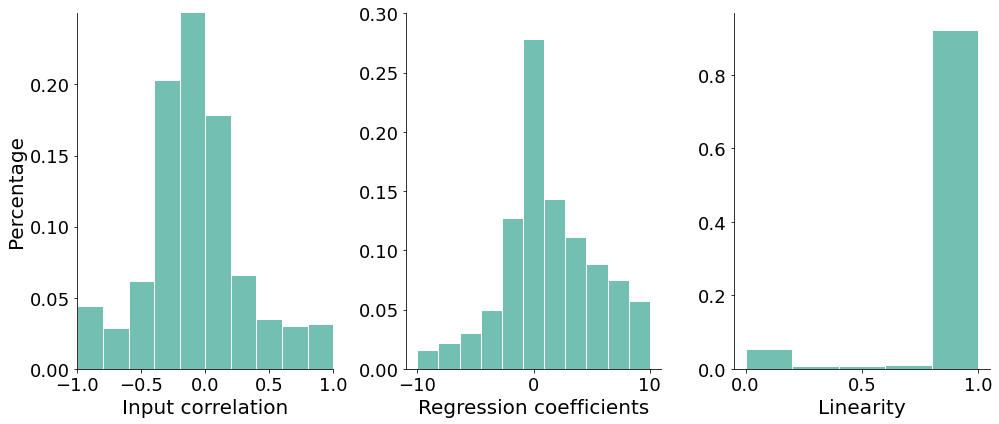

In [8]:
from plots import plot_data_stats
plot_data_stats(data)

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)


Optimization terminated successfully.
         Current function value: 0.233827
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.159056
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689426
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.666141
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.046514
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.054135
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000511
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.196640
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.185624
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.458026
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.307054
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.512731
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.080953
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.064419
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.530447
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.471890
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.159594
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127637
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.618921
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.564715
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.305088
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.532515
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.512061
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.611784
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.551042
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:18

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.607200
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.597865
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.617597
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.433465
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.198144
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.203762
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.063049
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.056003
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.493055
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.392847
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.201188
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.137805
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.425639
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.497036
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
         Current function value: 0.113536
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.108374
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.584069
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.071781
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.667421
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.638122
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.682613
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.587622
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.213279
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.648811
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.613808
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.240709
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.122000
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.026739
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000190
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.297825
         Iterations: 32
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.151633
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.118162
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.644758
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.565450
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.319358
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.236543
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.580746
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.345510
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.229963
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.674935
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.670443
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.096300
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.085476
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.657184
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.689551
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.678108
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.638494
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.615912
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.395972
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.356388
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000089
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.500717
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.202363
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675493
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.661532
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.291485
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.253725
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.483389
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.146098
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682230
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.656578
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144481
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135742
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669055
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.624229
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.306585
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.294030
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.681624
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.678061
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.586919
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.558474
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689961
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.040809
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.399697
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.311245
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.356161
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.232689
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.658544
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.550300
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.477766
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670124
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.622342
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.172467
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.167456
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.681963
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.612042
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.132651
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.110176
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.231630
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207019
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.291324
         Iterations: 32
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
         Current function value: 0.263780
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.209553
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.665461
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.638709
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.396193
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.334233
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.085243
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.079495
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.301857
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.279794
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.686395
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.261684
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.246973
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.691664
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.646335
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.666406
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.663514
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.664442
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.657608
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.664635
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.567730
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669255
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.553134
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.532300
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000025
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.669303
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.640554
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.489007
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.503261
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.253639
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127307
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.120606
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691040
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.657992
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.672330
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.199356
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.211236
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.203835
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.322600
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.130584
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.312882
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.284611
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.274108
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.243259
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.315809
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.227011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.041120
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.514571
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.213103
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.186179
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.092072
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.102200
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.056484
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.056449
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.000050
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.187845
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.180917
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.002379
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000191
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691770
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.624201
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.254750
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.134258
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127874
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.556237
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.510935
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.277417
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.171385
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.594519
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.428085
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimi

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.315543
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.266222
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.676499
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.612415
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Gradient evaluations: 25
         Current function value: 0.455414
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.677790
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.652672
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.038090
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.034121
     

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.610126
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.255869
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.250907
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.628630
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.619821
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.108189
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668773
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.618207
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000012
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.373611
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.284530
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.516589
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.510597
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687268
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.682013
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.693147
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.000259
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691646
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.685956
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685195
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.667145
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.172778
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.153778
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.633095
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.654656
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.631987
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.155515
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.151528
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.228440
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.110153
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.079262
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683125
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.676995
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675748
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.631478
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.624116
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.440233
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

Optimization terminated successfully.
         Current function value: 0.562827
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.510332
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.443256
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.321126
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.021357
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.003495
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000079
         Iterations: 35
         Function evaluations: 39
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.535490
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.308176
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.199721
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.378810
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.297619
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000011
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.236355
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.097724
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.096996
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.327216
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174658
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000174
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000026
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.625891
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.541322
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.191987
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.154103
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.674460
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.671194
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.591217
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.620840
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.553988
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.000058
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.647854
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.606621
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.101348
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.080529
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Gradient evaluations: 26
         Current function value: 0.599291
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.381999
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.350110
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.491326
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.487029
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.273613
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660633
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.629277
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000139
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.653342
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.663333
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.603505
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.330615
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.115497
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.126571
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000096
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.674185
         Iterations: 20
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.541796
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.525298
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.486380
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.269501
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.265812
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.558367
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.450557
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.268556
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.065327
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.285359
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.237753
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.047084
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.028700
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.366434
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.306672
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.153727
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.146874
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.224129
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.211614
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.552351
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.201196
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.248648
         Iterations: 33
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization fai

         Current function value: 0.193248
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174814
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.683263
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.630920
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.574252
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.521992
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.460234
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.533632
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.495515
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681341
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.665660
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.212058
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.198286
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.318002
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.497042
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.275005
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.471975
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.440509
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.364166
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.317767
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.334403
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.292955
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.075284
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.056952
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.008816
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.001598
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000102
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.305887
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.240765
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.280486
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.688515
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.651886
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.436606
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.255633
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.390416
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.365458
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.641713
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.604173
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.000211
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.616387
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.593563
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669327
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.522178
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.149140
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.207557
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.649165
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.606625
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.176881
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136524
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.060427
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.014177
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.449837
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.267104
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.128741
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.101368
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679221
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.647701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.339634
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.066205
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.525388
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.354533
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.661228
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.611494
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.659670
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.608155
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.335254
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.267076
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.671432
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.625046
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.177019
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.020038
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.003915
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.130625
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.123505
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.308199
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.300643
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.326471
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085026
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.086054
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672129
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.619320
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.257142
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.236821
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.053597
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.039425
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670457
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.513682
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.652530
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.562601
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.003907
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.618012
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.502853
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.320838
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.308510
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000478
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000227
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.591402
         Iterations: 27
         Function evaluations: 28
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.276757
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.163983
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136964
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.024575
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.135160
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.111318
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.559247
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
         Current function value: 0.099414
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.029359
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.579128
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.451786
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

         Current function value: 0.658863
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.242678
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.191785
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.679868
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.660353
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.692072
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.651437
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.410774
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.370158
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.369098
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.221342
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690875
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.674845
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681258
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.676519
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.604759
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.290872
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.277837
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.114708
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085694
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.437890
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.465620
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.429284
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688970
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.551406
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Gradient evaluations: 27
         Current function value: 0.557083
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677837
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.667059
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.267177
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.259782
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.519039
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.487858
     

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.601379
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.582021
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670981
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.623878
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.200866
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.196894
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 27
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.667370
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.622764
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.663818
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.636283
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683950
         Iterations: 20
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.665973
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000432
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000027
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672095
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.590686
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.434762
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.358685
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.060642
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.459090
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.500445
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.381701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.670864
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.635970
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000014
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.074699
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.052250
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.158622
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.118886
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.090420
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.085845
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.277062
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.621248
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.580289
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.462937
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.334993
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.662323
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.614294
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.454483
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.303063
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.218500
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675535
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.614110
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.492994
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.158532
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.647283
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.531027
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.371222
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.631048
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.566886
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.162315
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136946
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000452
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.092039
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.071034
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.245248
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.221408
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.028318
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.687428
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.665528
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.254005
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.247809
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.482721
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.232183
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672154
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.668184
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.140880
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127081
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.663063
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.630340
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.157917
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.155683
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.254973
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.122359
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.117890
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.476008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.182504
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.395557
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.374044
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.530888
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.146848
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.411158
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.390076
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.434918
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.403009
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.488185
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.128171
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.083461
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.510983
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.506361
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.614498
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.187163
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.167809
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.632944
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.536881
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.064928
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.660265
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.642297
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.106044
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.099968
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.137803
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.139311
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685485
         Iterations: 22
         Function evaluations: 24
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



         Current function value: 0.468600
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000452
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.677378
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.647569
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000009
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.141151
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.349768
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.280204
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000012
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.637603
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.615583
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.184771
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.075610
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.059540
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.134260
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136760
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.262605
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.238091
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.642912
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.559810
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.594387
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
         Current function value: 0.540633
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.256696
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.189660
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.244673
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:18

Optimization terminated successfully.
         Current function value: 0.609574
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.536713
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.249845
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144040
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.678431
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.661921
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.665653
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.690799
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.680942
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686809
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.618117
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680104
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.544868
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.689062
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.282010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.134634
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.129192
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.414417
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.354563
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.692737
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.647278
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.598109
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.658310
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.607583
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141960
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.118200
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.432175
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.357802
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.269131
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685493
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.666389
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.674896
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.543216
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.438385
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.286667
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000097
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000046
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.689926
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.607424
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.465261
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.306998
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.170116
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.286527
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.629150
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.557666
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.285874
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.185340
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.395621
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.309252
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.686072
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.527610
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683821
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.681813
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.104343
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.087480
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.446760
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.417016
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.391963
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.290877
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.237494
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635136
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.605154
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.184486
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.494342
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.370111
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.664829
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.582356
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.301691
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.280589
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.389310
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.386556
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.384429
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.389456
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.385259
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.301063
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.108744
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.643735
         Iterations: 25
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.283120
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.219893
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.365532
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.346379
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686067
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.612136
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000039
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.467802
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.119125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669248
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.601799
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.043007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.043016
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.108693
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.275916
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.263473
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.383769
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.362792
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.376696
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.300814
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.151923
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.582979
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.116486
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.112778
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.147990
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127103
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.569513
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.536127
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.691805
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.669779
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.685214
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.325670
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.319362
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687458
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
         Current function value: 0.676005
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687337
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.661004
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.073841
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.067998
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.105301
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.106734
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.255144
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.167813
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.368998
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.306808
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.271364
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.400912
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.330556
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.193056
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182955
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.601988
         Iterations: 23
         Function evaluations: 26
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.540484
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.402927
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.400684
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.363893
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.640100
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.366348
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.071357
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.685310
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.621654
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.365206
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.351810
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000216
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000009
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.601429
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.043548
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.043377
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.156908
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.134893
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.536558
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182808
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.137122
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678987
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.484530
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.463525
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.167998
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.322458
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.288629
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.268152
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.203107
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.112701
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.102170
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.560401
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.376128
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.191890
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.111716
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.108703
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.542021
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.182721
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.400598
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.378368
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.640404
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.511964
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.194265
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.154601
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.285551
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.241101
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.630887
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.591626
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.047076
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.045499
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.491405
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.479501
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.636167
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.546264
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.680845
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.042247
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000062
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.091999
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.094951
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.424535
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.252072
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000049
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000125
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.202303
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.209847
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.176083
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.037727
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.037260
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678259
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.649819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.124446
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.102034
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.488731
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.088312
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.196674
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.190933
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.192336
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.181666
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.633622
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.126479
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107400
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686670
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.661174
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.303276
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.260552
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682493
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.111402
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.103058
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.281224
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.255168
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.314123
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.215729
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.567902
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.528733
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.531944
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.379245
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.664976
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.614556
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000059
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000033
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.074834
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.691043
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.665290
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.206129
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683266
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.620276
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.340250
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.276312
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.627119
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.610201
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.598805
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.568899
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.576013
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.577748
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.210252
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692890
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.691942
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.300466
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.134214
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000405
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.342935
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.276463
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.599222
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.357203
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.513032
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.469798
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.320479
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.259850
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.035010
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.630085
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.570040
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.404569
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.358717
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.543193
         Iterations: 25
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.625872
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.605967
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.602114
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.671343
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.656358
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.267783
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.198433
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.285067
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.584395
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.471440
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.364908
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.362348
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000037
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.086686
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.479679
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.440288
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.203752
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.187348
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.330870
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.159801
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.468058
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.120977
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.116146
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.597155
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.578129
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685513
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.665636
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.190951
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.009327
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.167087
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.130997
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688244
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.677316
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688321
         Iterations: 25
         Function evaluations: 27
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.305311
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.235836
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.094198
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.087694
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.591656
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.533539
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.032820
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.171583
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.120521
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.568134
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.548115
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.434562
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.423366
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.683309
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.068094
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.014205
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.675722
         Iterations: 32
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.673905
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.394830
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.688202
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.649965
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.603868
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.550629
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.206416
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.183285
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678434
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.248388
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.241169
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.206693
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.172410
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.673065
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.513568
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.667149
         Iterations: 23
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.446967
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.549169
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.131456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.338004
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.228590
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677143
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.514535
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.526433
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.381319
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.257151
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679511
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.630754
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000008
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization fai

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.065795
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.044533
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691193
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.388976
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.588055
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.455452
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.154779
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682928
         Iterations: 20
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.665049
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.124942
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.106859
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.117277
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.120691
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.651586
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.133644
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.124890
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.578225
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.386977
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.123556
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.122300
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.241777
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.363387
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.263421
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.399475
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.211964
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000005
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.646626
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.368173
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.309183
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.197343
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.172249
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.637556
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.603026
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
         Current function value: 0.691413
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.690911
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.637673
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.630158
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         C

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.097668
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.341391
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.232224
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.322259
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.282664
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000074
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.238053
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.231903
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.186588
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136676
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680514
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.652390
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.347160
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121807
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.112249
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.465587
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.356611
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000023
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 25
         Function evaluations: 26
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.099116
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.058851
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.492043
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.438420
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.415184
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.284534
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.396260
         Iterations: 33
         Function evaluations: 34
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.084861
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.069216
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.371209
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.256863
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677460
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.497663
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.232403
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.615196
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.596147
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672026
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.656632
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.655700
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.298260
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.323951
         Iterations: 29
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.430569
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.015999
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.003962
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.606125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.570547
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659365
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.645756
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.178458
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.621710
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.590830
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.344025
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.337056
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144596
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.150283
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.235239
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.238906
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.203880
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.145330
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.110909
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.669804
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.565909
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.080683
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.663870
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.478784
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.171665
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.163704
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.494944
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659202
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.568411
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.416916
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.198590
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.447281
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.367068
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.290010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.288070
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.101396
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.074014
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.087971
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.080532
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.204707
         Iterations: 34
         Function evaluations: 35
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.574179
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.459522
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.404810
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.690626
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.509885
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.626755
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.027571
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.026058
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692100
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.689913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.272946
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.223296
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: Convergenc

Optimization terminated successfully.
         Current function value: 0.633259
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.595100
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.134030
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.122494
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.539536
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.387727
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.622089
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.376580
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.355121
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.223282
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.222046
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687242
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.635916
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.104691
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



         Current function value: 0.095772
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.656365
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.649123
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.439076
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
         Current function value: 0.346744
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.621685
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.567782
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.047929
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.045710
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.688096
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.658673
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687817
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.668714
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.335992
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.044092
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.042217
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.268858
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.240888
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.353829
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.310826
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.044402
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.334313
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.233735
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.338798
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.182351
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.650178
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.398425
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.535289
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.491105
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.665668
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.641034
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.223237
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.127649
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.535107
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.516844
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.391449
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.384816
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.178799
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.458494
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.432011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.439471
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.245330
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.226212
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.643308
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.356359
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.310464
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.627971
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.608725
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.662412
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.641584
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.234977
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.204190
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.638080
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.544782
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.029586
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.092576
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.531317
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.314086
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.203437
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.193634
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.105307
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.099986
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.184529
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174063
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.614289
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.577651
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000015
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.627646
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.052570
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.043868
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.158931
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.147198
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 29
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.391073
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.390232
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.196109
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.076941
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.516022
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.488761
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.245660
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.311605
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.185807
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675541
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.554479
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.555237
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.551479
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680019
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.084927
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.590075
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.484633
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.473257
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.355977
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.002503
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000005
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.677135
         Iterations: 20
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.665973
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000056
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000059
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.639094
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.294011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.108061
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.263426
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.203187
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.100064
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.079540
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.130021
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.117460
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.000036
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.453633
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.253471
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimi

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.552450
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.402325
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.305609
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.333326
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.303354
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.306238
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.226893
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.435139
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.352969
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.032072
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.040405
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.196641
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.152276
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.645615
         Iterations: 29
         Function evaluations: 30
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWa

         Current function value: 0.016088
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678591
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.636725
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.187950
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.186299
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.537646
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.524459
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.347816
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.330730
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.060518
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.056781
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 21
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.299063
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.261010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000285
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000260
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.279430
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.255447
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.400548
         Iterations: 29
         Function evaluations: 31
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.190700
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.163145
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.291875
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.252376
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.530946
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.494745
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680249
         Iterations: 22
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.678229
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.568233
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.554819
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.526490
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.683534
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.674836
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689526
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.348134
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.263459
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686634
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.646700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.400412
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.386195
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691040
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.152864
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107378
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000359
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000018
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.652624
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.376831
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362432
         Iterations: 31
         Function evaluations: 32
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.172639
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.275146
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.271137
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.334739
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.342720
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.252678
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.238341
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.346484
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.287886
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.103048
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.101155
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000008
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.000520
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.178039
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.153768
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.315567
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.283451
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688521
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.682124
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 19
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.311739
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.297685
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.175354
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.171019
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.124182
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.120926
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.122356
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.098345
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.644077
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.125217
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121156
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.322383
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.285158
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.588086
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.231994
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.262424
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.208888
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.219443
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.187420
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.169813
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.586978
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.570593
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 24
         Function evaluations: 26
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.125754
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.113939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.652889
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.625752
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000520
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.575488
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.524228
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.599079
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.290079
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.215658
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.193136
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.384252
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.341048
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 19
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.282691
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.220399
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687570
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.669325
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.109632
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.095902
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.231122
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.252140
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.307680
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.296344
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.608461
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.538248
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.610249
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.431302
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.167615
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.631054
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.602600
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.599250
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.514777
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

Optimization terminated successfully.
         Current function value: 0.650258
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.478709
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.597770
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.567132
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.256154
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.244726
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.612045
         Iterations: 29
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.000546
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.372275
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.237598
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.571986
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.588432
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138976
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.151172
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.643202
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.638466
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.377834
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.339307
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.130051
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.074741
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.546982
         Iterations: 25
         Function evaluations: 27
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li


         Gradient evaluations: 38
         Current function value: 0.009618
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679780
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.481071
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.100550
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.071057
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670639
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.617086
         Iterations: 35
         Function e

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.181519
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.673666
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.594301
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.165533
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.196344
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.667762
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.649884
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.621885
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.535889
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.185331
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.340771
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.238753
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.674884
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.469659
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.466841
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.405651
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.212475
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.209438
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682715
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.568103
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.658797
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.598149
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.142701
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.340892
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.123362
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.112678
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.326183
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.154937
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678384
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.655704
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.105726
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.090665
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000096
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.627612
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.590082
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.163670
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.069622
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.023754
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670395
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.602348
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.645369
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.542173
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: Convergenc

         Current function value: 0.578466
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.456221
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.421979
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.397040
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691801
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.688449
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWa

         Current function value: 0.010514
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.297678
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.187770
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.092573
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.089609
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.601180
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.559920
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.264509
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.290747
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.283152
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.684779
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.684138
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685996
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.670828
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.423407
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.411626
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.362574
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.322620
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.221359
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.249675
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.166700
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.390147
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.278582
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691001
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.687424
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.648344
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.372829
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.378583
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.255851
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.225168
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.293002
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.210482
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000212
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.599840
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.495276
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.445194
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.002257
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.039223
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.017667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.000198
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.250839
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.179624
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.319468
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.318249
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659145
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.615193
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.633187
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.285417
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.088925
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.061549
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686736
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.584270
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.313326
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.299682
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.078900
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.072804
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.577545
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.508306
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.342220
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.328189
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682853
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.447074
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.337750
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.432745
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.406431
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659710
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.572104
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.608488
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.619133
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.591007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.637961
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.329309
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.661432
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.640013
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.504205
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
         Current function value: 0.071704
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.065229
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.000216
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.169331
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.169235
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.597533
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.573812
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.417954
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.379867
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.486876
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.469372
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.651460
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.673650
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.679747
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.674116
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.658211
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.656588
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.480856
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.429269
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.100999
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.097574
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.330411
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.304923
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.252146
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.142267
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.628117
         Iterations: 27
         Function evaluations: 28
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.372878
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.586792
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.479732
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.294896
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.283755
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.673783
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.470664
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.185417
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.170659
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135368
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.130511
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677092
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.645907
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.285249
         Iterations: 32
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.285819
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.069787
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.073241
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687194
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.653490
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.088798
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.036144
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.176842
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174016
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685709
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.655785
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.691237
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.682102
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.523693
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.157528
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.150452
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.332115
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.233035
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000045
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.235987
         Iterations: 32
         Function evaluations: 34
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.185047
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.160843
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.002734
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.618433
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.563369
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.630167
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.527950
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.240269
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.192452
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.463887
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.602413
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.448548
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.619395
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.593957
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.363932
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.273737
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.546207
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.243315
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.624561
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.592963
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.575647
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.244574
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.484184
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.372331
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.682500
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.563379
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.361135
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.387543
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.354893
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.169644
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138632
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.304576
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.258023
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689222
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.608245
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.214257
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.204396
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.192398
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.172322
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.621819
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.615889
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.566253
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.498805
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.665398
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.497280
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.363619
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.326229
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.433760
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.497726
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.460224
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.465166
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.440913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.242181
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.198132
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.218501
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.594616
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.284357
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.283056
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.653976
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.583885
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.605267
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.597178
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.256313
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.057128
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.201452
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.163903
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.060309
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.044219
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684034
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.213606
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.155250
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.666557
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.644030
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.152960
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.138116
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138434
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.297640
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.183389
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684224
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.166613
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.160463
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.526145
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.479507
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.566740
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.432624
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.043687
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.633125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.234316
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.220563
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.146452
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.117967
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.149308
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.150731
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.529198
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.317699
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.217195
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 26
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.691829
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.630890
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.604163
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.413240
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.351769
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.654422
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.637444
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690371
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.657980
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.409436
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.207953
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.119597
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.137722
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.115999
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635691
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.564816
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.182695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.003071
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.605966
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.553823
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.250858
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.201021
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 18
         Function evaluations: 20
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.637229
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.372643
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.298337
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.444760
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.220797
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.110848
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.101433
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.612108
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.531055
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182980
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.169222
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.259976
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.206840
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001832
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000087
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.287571
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.276119
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.283125
         Iterations: 32
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.257573
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
         Current function value: 0.188499
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.181281
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.622377
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.016144
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.280544
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.277194
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.170153
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144293
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659438
         Iterations: 25
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.073321
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.674667
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.629344
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.204854
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.193169
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.197842
         Iterations: 34
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.172266
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.676536
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.660643
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.670361
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.654585
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.242244
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.188818
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.057036
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.006456
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000974
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.266804
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.233892
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.113884
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.098674
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.421752
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.570654
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.211037
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.203970
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680777
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.641406
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.590667
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.585592
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.676379
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.649025
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.467519
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.375784
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.224530
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000012
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.373275
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.366385
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.596118
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.686957
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.680588
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.551556
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.463669
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.270130
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.214600
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660139
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.539157
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.453721
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.361555
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.323456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.364117
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.352851
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.294436
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.183606
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.101954
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.092380
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.656424
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.060180
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.056963
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.000110
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.536148
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.464516
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.641755
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.494729
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.375175
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.382282
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.371807
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.597153
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.237543
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691525
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.612995
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.589715
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.254016
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.222831
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.220200
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.153001
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.618243
         Iterations: 25
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.267332
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.667095
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.606638
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.678206
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.618336
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.686936
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.656662
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.621420
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.570328
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.455805
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.095334
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.194051
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.180767
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.600902
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.177727
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685767
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.669853
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000197
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000184
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207416
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.207948
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000048
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.587147
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.566670
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.466259
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.406901
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 18
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/pyth

         Current function value: 0.675531
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.190314
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.171457
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182095
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.181671
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.640211
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.549252
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.000012
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.358297
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.324495
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.446574
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.276266
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.153211
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.164696
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.036940
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.034451
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.226587
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.158971
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.100062
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.093449
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.433812
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.187879
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.677651
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.672684
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.676913
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.641688
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.237631
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.674762
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.647849
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.659609
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.592325
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.000183
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.668845
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.634344
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.674463
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.654196
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.629991
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.347805
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.489934
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.309384
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.234520
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.070855
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.206859
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.198600
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.180786
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660739
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.572342
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.315209
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.298690
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.496319
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.676048
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.595773
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.590199
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.439598
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.086760
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.667999
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.633247
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.264809
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.219850
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688488
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.676028
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.611654
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

         Current function value: 0.554470
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.662378
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.637783
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.466735
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.389443
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.358151
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.247896
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.582891
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.265775
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.214874
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.328947
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.288353
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.564846
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.466646
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.638277
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.382769
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.360347
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.132687
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.114362
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687761
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.638471
         Iterations: 35
         Function evaluations: 38
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.677161
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.346596
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.407943
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.369227
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.337547
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.309415
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.683933
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.098803
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.066028
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.061893
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.282917
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.145470
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.124221
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.125238
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.199461
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.208726
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.512918
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.541124
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680588
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.306546
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.086491
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.016875
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.118505
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.105379
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.308754
         Iterations: 27
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.287962
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.108454
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.631947
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.575630
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.078042
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.041608
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.253669
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.229779
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.335757
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691822
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.661383
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.452645
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.145425
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.264552
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207389
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.081022
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.451018
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.302773
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.369956
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.239031
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683456
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.655143
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.659970
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000062
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.688588
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.635154
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.320356
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678000
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.599660
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.599569
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.425396
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.461271
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.658046
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.332691
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.539730
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.533923
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.522536
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.384151
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.295267
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.250876
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.172235
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.194592
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.166536
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.293614
         Iterations: 31
         Function evaluations: 32
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.073887
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.065080
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.319554
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.293042
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675441
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.646203
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.319936
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.500117
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.488355
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692630
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.615895
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.685098
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.612959
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.559316
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.313599
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.249857
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.254667
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.202146
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.159553
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.643789
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.574895
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.277382
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.105456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.664546
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.624964
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.554951
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.485070
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121697
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.072454
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000109
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.671696
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.586389
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.028139
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.367548
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.318703
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.148122
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.291073
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.226109
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.598637
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.539662
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.463012
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.440142
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.127502
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.109820
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.455802
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.304947
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.019162
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.002753
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.551085
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.673729
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.640999
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670238
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.398710
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.663655
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.617214
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.130777
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.103749
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.092626
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.450101
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.375605
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.596466
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.573954
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.664272
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.665335
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.368689
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.119366
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.065995
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.517772
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.460731
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686954
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.297602
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.127552
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.121545
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.209517
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.205123
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.292424
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.227723
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.379434
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.366943
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.208036
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.200623
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.360215
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.331863
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.515332
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.616694
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.605227
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.647452
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.634400
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207102
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.208538
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675027
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.526250
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.359630
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.294915
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141790
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.132665
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.424615
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.184635
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.072794
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.417508
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.412227
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.641382
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.616154
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.589305
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.492141
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.670317
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.630656
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.143530
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.128465
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.164949
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.157745
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.109439
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

         Current function value: 0.074948
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.088675
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.216125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.188659
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.618928
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.590522
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.315263
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.476758
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.401476
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.232439
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.225673
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.000127
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.687329
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.664432
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.683469
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.661858
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.123902
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Gradient evaluations: 36
         Current function value: 0.091565
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.643150
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.447304
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.606373
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.581720
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692319
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.618234
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.686836
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.670453
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687346
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.683889
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.615331
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.361863
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.312815
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.137952
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688911
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.619592
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688054
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.684538
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.243025
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.227218
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.083838
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.078949
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.126159
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.098059
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689816
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.656734
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.191642
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000008
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.063782
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.065221
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.439862
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.372850
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.098197
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.175560
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.190241
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.645529
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.549399
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.247679
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.213042
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 23
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.310346
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000277
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000014
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.568307
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.440262
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682760
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.666115
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.160038
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666216
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.646526
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.148568
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.125992
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.367065
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.293225
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.129220
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.644355
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.485794
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.103232
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107849
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.360892
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.263660
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.505721
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.254623
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.229736
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.613230
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.531384
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.205064
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.157999
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.581925
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683399
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.629475
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.260596
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.258108
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.330067
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.262332
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.687567
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.668122
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.690852
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.680879
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.594602
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.525828
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.287550
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.079273
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.108138
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.087822
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.515742
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.489694
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.641571
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.482151
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.409808
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.189375
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.496050
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.341974
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.221322
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.632334
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.482298
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000163
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000124
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.678986
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.159892
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.266911
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.250240
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684922
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.587053
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.262239
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.258348
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.287105
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.367559
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.261523
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.271654
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.239161
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.080489
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.082318
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.153240
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.139716
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679610
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.477037
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.663726
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.623064
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.688416
         Iterations: 35
         Function evaluations: 38
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.000328
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000308
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.258995
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.248164
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.090174
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.026835
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.036640
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.627057
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.643394
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.578408
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.149290
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.126099
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668702
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.527875
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

         Current function value: 0.101897
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.091102
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.649278
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.598217
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.692351
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.656050
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.301310
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.108459
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107301
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.357349
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.315684
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.383919
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000060
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000030
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.571929
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.517106
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.171855
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.134087
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 30
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.437113
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.309637
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.310820
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.226422
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.402462
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.312666
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.660937
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.343375
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.244810
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.560035
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.380748
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.224574
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.177020
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.580068
         Iterations: 30
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.071830
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683400
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.637631
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.657743
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.638174
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.135757
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107338
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.

         Current function value: 0.000067
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.095714
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.096321
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.399413
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.353562
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.396621
         Iterations: 32
         Function evaluations: 33
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.080084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.027590
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.667757
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.638081
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.536172
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.507784
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.218325
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.575130
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.247289
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.238819
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.218569
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.203626
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.255961
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.169147
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.228859
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.224765
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.214658
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.125271
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.680968
         Iterations: 26
         Function evaluations: 27
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.667037
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.638342
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.148476
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127354
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.385175
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.360374
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.206893
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.475250
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.442505
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.450072
         Iterations: 31
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.372826
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.152307
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.145431
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.651345
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.571999
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182922
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.400286
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.593882
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.574680
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.658334
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.536912
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.261603
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.080669
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.646471
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.634132
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.432011
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.379745
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.262631
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.298799
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.688740
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.661017
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.685482
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.552700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.660357
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.616934
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.043007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.043016
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.649765
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.625977
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.503453
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.356941
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.050569
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.589003
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.100967
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.059810
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.616193
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.504240
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.330308
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.287845
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.577940
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.266865
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.221987
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.521888
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.395647
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000006
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.677788
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.670856
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.435834
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.233580
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.558470
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.526361
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         C

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWa

         Current function value: 0.042219
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001121
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.568531
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.547350
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660142
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.623634
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.251127
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000041
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 18
         Function evaluations: 20
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.520077
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.265778
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.218614
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666978
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.614542
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.048071
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.050969
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.262989
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.171444
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.132779
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691278
         Iterations: 20
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.686549
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.399716
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.136740
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.386091
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.368237
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.229983
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.209801
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.111092
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.154564
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135325
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677921
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.634438
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.395649
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.260823
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.053460
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.048077
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000069
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 32
         Function evaluations: 33
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.003930
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.354932
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.099151
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.185138
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.179218
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127798
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.116281
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.302221
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.300062
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675485
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.643647
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.620163
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.523163
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.683939
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.029215
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000046
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.239323
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.214250
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.015377
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000611
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.144181
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.303908
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.225754
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669881
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.664509
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000009
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.431748
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.364167
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.313433
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.223861
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 16
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.673916
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.592612
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.251209
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.252119
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000039
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.149746
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


Optimization terminated successfully.
         Current function value: 0.306755
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.261115
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.168792
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.161832
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.333739
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.202518
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.663918
         Iterations: 35
         Function evaluations: 37
         Gradient e

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.438074
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660369
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.642888
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.244745
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.230279
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000010
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.681534
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.660883
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.574805
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.423919
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.674966
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.572942
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.529879
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.252260
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.040503
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.574407
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.565373
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679055
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.638037
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.335840
         Iterations: 32
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.157028
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.064298
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.364754
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.295335
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.622193
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.572282
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688076
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.050189
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000270
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107780
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.103753
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.693077
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.688217
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.391009
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.643848
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.561653
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.306544
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.258192
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.266653
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.160420
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.069098
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687622
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.679311
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.072375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.048780
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.039133
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.025435
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.270238
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.261630
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.669085
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.628490
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.062438
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.051467
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.453518
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.315696
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679176
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.619287
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.673931
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.352751
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.110306
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.091600
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672695
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.656866
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.202132
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.197773
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666207
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.636096
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.346465
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.261840
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.620118
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.060449
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.005277
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.006587
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.379169
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.225758
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.606257
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.506148
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.129634
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.114192
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660123
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.623609
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.123982
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.116907
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.152050
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.003947
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.093646
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.090125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.128461
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.126333
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.681345
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.655155
         Iterations:

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.530112
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.436845
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.296907
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.122492
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.103205
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691304
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.667796
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.193670
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182389
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.597122
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.506901
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.181412
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.128711
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.646296
         Iterations: 27
         Function evaluations: 28
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.613755
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.378080
         Iterations: 27
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.299280
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.413499
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.240111
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000049
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000014
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.622520
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.474974
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.305800
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.239512
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.300087
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.500844
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.202006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.566331
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.474475
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.639167
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.617508
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000186
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.146506
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.134422
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.526861
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.447620
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.401562
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.374643
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.313241
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.147072
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.091128
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.673444
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.627085
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.627752
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.408923
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.475741
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.366122
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.032457
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.001348
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.174402
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.139496
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.556738
         Iterations: 30
         Function evaluations: 31
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.536270
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.288722
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.251360
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.392605
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.288627
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.050509
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.012777
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.143465
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.133258
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.210510
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.214729
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.024400
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.025540
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685890
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.159914
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.322435
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.282242
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692222
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.615476
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.662940
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.610569
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.680085
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.656060
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.039340
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.037949
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.438571
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.358416
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.077093
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.505675
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681361
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.579340
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.320949
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.188527
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685398
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.665971
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.313580
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.226202
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.159783
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141429
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000127
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000060
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.550524
         Iterations: 27
         Function e

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.627928
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.591742
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimi

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

         Current function value: 0.000043
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.600172
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.515948
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.608241
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.572757
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.470277
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.132474
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.279636
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.221663
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.152904
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.134940
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

Optimization terminated successfully.
         Current function value: 0.644488
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.638511
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680661
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.661254
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.364264
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.317599
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.656533
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.659129
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.671738
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.581807
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.372694
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.286808
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.340417
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.289208
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.672374
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.650835
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.239084
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.226184
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684441
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.642646
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.678532
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.066773
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.269971
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.219725
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.289978
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.286626
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

         Current function value: 0.386109
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.641211
         Iterations: 31
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.589055
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.675640
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.656010
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.637878
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.494257
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.212362
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.212069
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.407345
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.353703
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691591
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.670116
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.669180
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.586759
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.498338
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.236111
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.317767
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.283391
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.655745
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.581948
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.651425
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.633842
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.679932
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.206548
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138353
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.067303
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.048002
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.186308
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.137957
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.275145
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.268943
         Iterations:

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.221340
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.198066
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.194360
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.607899
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.581516
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000013
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 33
         Function evaluations: 34
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.002071
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668088
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.640836
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687377
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.625920
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.643630
         Iterations: 25
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.308728
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.310694
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.426189
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.290450
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.113962
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.103458
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682543
         Iterations: 25
         Function evaluations: 27
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 17
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.004023
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001361
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000012
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.641571
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.636709
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.596790
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.439146
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.386038
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.211632
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.652592
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.618171
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.546477
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.523842
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.147141
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.116808
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.546136
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.612260
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.550471
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668472
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.649769
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.250681
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.233696
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.513940
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.195310
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.189208
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.301422
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.307418
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.423571
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.155443
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r


         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.244779
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.241546
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.120815
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107380
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.068827
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.037624
         Iterations: 35
         Function evaluations: 37
         Gradient evalu

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.342182
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.361401
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.333953
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660367
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.627232
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.260994
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.198870
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.112286
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.109946
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666482
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.616607
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.122178
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.652113
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.637850
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.679554
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.579340
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.143258
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.128397
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.638797
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.678972
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.668127
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.373662
         Iterations: 26
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.272697
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.230579
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.155633
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.271720
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.360120
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.313810
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.483896
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.264301
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000008
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: 

         Current function value: 0.191095
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.288424
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.281899
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690641
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.674831
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.498596
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.462383
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.392452
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.687396
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.675207
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.430991
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.182687
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.081605
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.654759
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.633648
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.185209
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.179073
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.276846
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.173122
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.388208
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.343041
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.403207
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.313357
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.667938
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.610917
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692423
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.647516
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.678122
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.629730
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.019126
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.361204
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.406105
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.369584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.090633
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.091621
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.340006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.260160
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.302787
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.617476
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.511109
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.569436
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.551158
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.609301
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.569399
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.507159
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.242897
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.692365
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.686761
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684425
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.627526
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.610715
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.649365
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.598907
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.121769
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.103409
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.005300
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.622057
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.597966
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.038608
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.012255
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.332493
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.316048
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.438788
         Iterations: 29
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.204169
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.200047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.190414
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689895
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.674908
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.377496
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.375351
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.668093
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.536234
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.637445
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.608944
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.172161
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.173176
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.657686
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.186368
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669870
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.649010
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.628716
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.523245
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.520635
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.476974
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.269265
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.605330
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.367357
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.246211
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.222419
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.540673
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.350958
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.098900
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.093642
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.511633
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.329218
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.002903
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.040554
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.567239
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
         Current function value: 0.253624
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.232744
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.682885
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.659953
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.263692
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.613769
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.566755
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.549036
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.217297
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.662945
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.622541
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.594429
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.508221
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.358833
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.095793
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.520734
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.426230
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000010
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.289684
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.290415
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.232173
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.210960
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.583491
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.618923
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.564080
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.485336
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.451774
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.333303
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.332407
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.627354
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.692980
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.672040
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.452085
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.229965
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.433508
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.272599
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.160188
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.383066
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.673950
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.614388
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670329
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.502548
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.549108
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.445272
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.322025
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.319078
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.600447
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.538011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.667185
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.619834
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.678272
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.098640
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 16
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
         Current function value: 0.681047
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.619533
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.587124
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.477541
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.622436
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.587327
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.535059
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.470938
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.442688
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.336961
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.314234
         Iterations: 34
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.630522
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.421440
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.219280
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.619901
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.611340
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687134
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.682444
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.023229
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.008453
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.105980
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.018744
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.461764
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.353286
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 28
         Function evaluations: 29
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.582617
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.676399
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.655145
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691269
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.638685
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675183
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.649679
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.099858
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.077480
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.630925
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.365207
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.050396
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.051727
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.380426
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.314151
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.236059
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.691709
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.519130
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.692760
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.644170
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.257384
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.212806
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.526486
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.496837
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.648601
         Iterations: 26
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000027
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.291245
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.133016
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.325585
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.309558
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085182
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.068078
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.470687
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.437613
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675743
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.293517
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000032
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000068
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.058173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.002112
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684778
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.611348
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.334890
         Iterations: 29
         Function evaluations: 31
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.201086
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 16
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
         Current function value: 0.501986
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.371402
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.434766
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.395790
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.124923
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.124604
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.045250
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.037772
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.648952
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.586359
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.676758
         Iterations: 22
         Function evaluations: 24
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.575835
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.385579
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.170088
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.168780
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.151573
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadis

         Current function value: 0.658448
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.266466
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.254071
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.205069
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691275
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.655731
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.553479
         Iterations: 29
         Function evaluations: 30
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.593522
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.553303
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.251456
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.223813
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686273
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.618619
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669267
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.663155
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.559995
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.057642
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.040192
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207433
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.192033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.548940
         Iterations: 29
         Function evaluations: 31
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.638516
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.378606
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.294678
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.113750
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.103985
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.201789
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.193111
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.424655
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.148888
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.233288
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.173459
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683907
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.662982
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.597673
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.259633
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.262166
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.670756
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.326006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.298815
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.693147
         Iterations: 0
         Function evaluations: 1
         Gradient evaluations: 1
Optimization terminated successfully.
         Current function value: 0.693147
         Iterations: 0
         Function evaluations: 1
         Gradient evaluations: 1
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.211555
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.558501
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.409381
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.149478
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.133321
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000698
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000099
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.062439
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.284273
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.279103
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.648967
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.620427
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000071
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000018
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.615286
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.406904
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.379156
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.127360
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000046
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.350919
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.575000
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.229958
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.222508
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.664092
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.545022
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.569319
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.496579
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.292991
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141139
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135589
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.157560
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135512
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.664479
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.614331
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.022593
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000800
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.188888
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.599964
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.575876
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.667736
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.612289
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000009
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.378113
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.280868
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.501702
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.485512
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.476946
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.277075
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 18
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.163092
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.667913
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.627903
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.645518
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.116633
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.314458
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.200424
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.009852
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.505040
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.431860
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.332690
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.280702
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.189570
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37


         Gradient evaluations: 32
         Current function value: 0.200044
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.008288
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.104309
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.009980
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.171341
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.149199
         Iterations: 35
         Function evaluations: 37
         Gradient evalu

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.628003
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.094828
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085137
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.132994
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.119033
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.504250
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135640
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.625854
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.557593
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.323622
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.314913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.244844
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.229254
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.191822
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000817
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001429
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.225261
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.124681
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.655109
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.510622
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.656890
         Iterations: 25
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.156022
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.123557
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.435541
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.141341
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.352368
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.575794
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.332231
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690740
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.617514
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.290860
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.134683
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686587
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.594612
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.592887
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.029840
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.025186
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.301049
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.264169
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 25
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.064378
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.222647
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.127187
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.189225
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.186519
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.377918
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.355483
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.066621
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.068412
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691846
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.683751
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.637171
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.526798
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.275976
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Gradient evaluations: 32
         Current function value: 0.250791
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.016842
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000310
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.575225
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.477408
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182073
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141676
         Iterations: 35
         Function evaluations: 36
         Gradient evalu

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.487728
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.322562
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.377164
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.308301
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000006
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.611892
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.566538
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.350190
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.343815
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.566745
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.654949
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.634328
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.684978
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.671055
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.145237
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.137435
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.549715
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.210360
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174083
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.307146
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.255393
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.523031
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.415063
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.433723
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.132043
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.118949
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.612920
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.592387
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization fai

         Current function value: 0.179826
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.159288
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.667478
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.545582
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.617143
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.562872
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.689199
         Iterations: 19
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.664337
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.643388
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.690513
         Iterations: 3
         Function evaluations: 6
         Gradient evaluations: 6
Optimization terminated successfully.
         Current function value: 0.690470
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimizat

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.379980
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.219827
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001994
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.006126
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688205
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.536707
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.512177
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.207258
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.350916
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.287581
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.652524
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.619753
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.629197
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.516859
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.186640
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.181759
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677737
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.647081
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.380016
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.607537
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.471002
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.689567
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.647440
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.624801
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.588536
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660923
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.368808
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.200202
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.625557
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.187514
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.168089
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.535186
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.514424
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.240138
         Iterations: 31
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.607175
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.564370
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.461603
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.236640
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.199926
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.411643
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.340768
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.373604
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.100784
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.092775
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.480417
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.346554
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.236973
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.218394
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.476622
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.285465
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.221441
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135152
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.125266
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672294
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.655102
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.616768
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.607912
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.529974
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.232577
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174391
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.364567
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.316382
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 16
         Function evaluations: 17
         Gradient evaluations: 17
         Current function value: 0.129921
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.107888
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.007828
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.003103
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.669033
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.636469
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.676550
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.667413
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.642833
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

Optimization terminated successfully.
         Current function value: 0.301248
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.233256
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.594570
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.551046
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.368292
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.070397
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683025
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.542153
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.169998
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141841
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.569000
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.559448
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685555
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.618366
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.689113
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.342835
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.349624
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.671195
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.646235
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.193110
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.188757
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.343866
         Iterations: 28
         Function evaluations: 30
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r


         Gradient evaluations: 28
         Current function value: 0.331193
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.195770
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.170098
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.400440
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.272048
     

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.243586
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.599588
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.579659
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.634306
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.534225
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.607746
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.534415
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.000019
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.209717
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.168908
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.677466
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.658471
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.310322
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.170047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.139116
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.133096
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121941
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.074053
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.081715
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r


         Current function value: 0.235743
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.147105
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.412130
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.242910
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.116201
         Iterations: 35
         Functi

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141575
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.655403
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.563641
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.652041
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.529493
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681689
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Curre

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.092085
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.051625
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.292005
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.284274
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677609
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.384890
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.299602
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

         Current function value: 0.064221
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.053535
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.562709
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.449589
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.445988
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.324173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.046631
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.456440
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.634908
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.621417
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.434002
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.417754
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.640714
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.615072
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.232825
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.205991
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689879
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.675811
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.093636
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.087668
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.042366
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.089229
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.481083
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.390707
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.597404
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.420670
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.543211
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.314515
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.667157
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.529772
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.183977
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.499817
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.250960
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675763
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.643052
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.251120
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.091871
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.080600
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687772
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.641905
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.628566
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.596330
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.070894
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.046843
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.668428
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.421317
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.649909
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.598251
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.474213
         Iterations: 32
         Function evaluations: 33
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.588999
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.431925
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.403258
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.557582
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.475102
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.233047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.223782
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.371102
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.317365
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.490752
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.429642
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000545
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.000343
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000078
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.257816
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.254906
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.350836
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.206861
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.233813
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.020057
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.190688
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.457034
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.341207
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.053050
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.056913
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.419433
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.328938
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 21
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.680123
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.266771
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.286500
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681826
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.674523
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.668791
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.632684
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.156737
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686527
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.660851
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.514787
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.436634
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691664
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.684972
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

         Current function value: 0.154792
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.131735
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.290854
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.239397
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.676668
         Iterations: 27
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.677485
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.628336
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.616108
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.599785
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207418
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.207686
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000465
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.632614
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.435468
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.397182
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.474122
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.404452
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.133677
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.140962
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.105892
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.659619
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.631860
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.261401
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.180006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.685038
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.669094
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.214545
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.179080
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.242848
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.072714
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.028730
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.495580
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.132415
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.121239
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.239647
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.240458
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.481318
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.417319
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
         Current function value: 0.108507
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.102521
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.557950
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.315691
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138080
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.464897
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.466069
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.175081
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.155678
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683174
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.609241
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.116807
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.131400
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.117333
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.258646
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.236161
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138066
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.122789
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.583388
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.131070
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.024148
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.308657
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.312462
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.674561
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: 

         Current function value: 0.155898
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.323333
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.308323
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.268571
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.208220
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.534404
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.038511
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001550
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.176056
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.133498
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.554495
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.312940
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.177671
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.152718
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.344745
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.304015
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.364013
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.313019
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.547943
         Iterations: 29
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params avail

         Current function value: 0.414022
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.625288
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.492697
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.344688
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.325727
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.478896
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.446171
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.584101
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.367366
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.303913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.616901
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.446639
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.663193
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.618634
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.313326
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.276108
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.369432
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.198304
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.413667
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.301434
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.592059
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.546760
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.682467
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.675515
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.526170
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.097354
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.654903
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.619769
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.446276
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.411351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.538375
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.343597
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.216558
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.208924
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.384655
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.305841
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.177101
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.162402
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.236779
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.172481
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.164219
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.602645
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.580254
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.012578
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.691916
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.199144
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.394076
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.382501
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.457290
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.405367
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691965
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.682634
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.649847
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.608123
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362574
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.242352
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670656
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.648004
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.685641
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.334396
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.089148
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.076805
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.074489
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.596981
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.461042
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.661570
         Iterations: 23
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.513671
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.688059
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.639242
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.259440
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.257469
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.122940
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.026291
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000056
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000006
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.175380
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144228
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.280663
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.214175
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141382
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.091727
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

         Current function value: 0.609555
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.625716
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.550442
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.685977
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.615592
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.053906
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.057578
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.112457
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.688870
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.673107
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.516015
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.148707
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.643010
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.568331
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.424814
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.137141
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.115074
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.658174
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.614322
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.312941
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.090244
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.049238
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.650284
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.614706
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.627151
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.603406
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.317086
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.248090
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.231093
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.181614
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.144141
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.661973
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.592801
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py


         Gradient evaluations: 28
         Current function value: 0.513175
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.000130
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.159994
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.101225
     

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.304549
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.186402
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.415838
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.356327
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.463913
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.319309
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.238938
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/pyth

         Current function value: 0.111913
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.099851
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.690625
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.648038
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.360103
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.321721
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.139770
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.497280
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.529866
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.285363
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.241052
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.210751
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.509734
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.445163
         Iterations: 35
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.660701
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.078541
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.075114
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.320099
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.314228
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.588630
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.529664
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.637509
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.614355
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.666565
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.618062
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.317902
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.249829
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.110182
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.211058
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.204698
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.179497
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.173649
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.514238
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.256520
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.210212
         Iterations: 33
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.663549
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.617161
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.405990
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.362474
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000042
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.244654
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.112700
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.182433
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.182491
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.048951
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.047600
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.577135
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.323415
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.339856
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.320705
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.372541
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.295276
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666732
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.282030
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.275983
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.637811
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.141346
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.122125
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000703
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000164
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.000719
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.165908
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.161967
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.004304
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000135
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.040576
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.034603
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.358777
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.321736
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688579
         Iterations: 23
         Function evaluations: 25
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.115908
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.012643
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.645790
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.576833
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.023646
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.015197
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.212195
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.206818
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.194108
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.608447
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.536557
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.670041
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.609709
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.654999
         Iterations: 22
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.516709
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.083851
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.075162
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.676488
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.666152
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.236036
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.205862
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.659617
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.354411
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.008470
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635976
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.273616
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.073330
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.071953
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.175666
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.173869
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.211632
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.203075
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.638367
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.587513
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.535521
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.244998
         Iterations: 30
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.243067
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.472616
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.361190
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.046648
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.186122
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.150953
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.345596
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.334494
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.532283
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.459721
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.066488
         Iterations: 34
         Function evaluations: 35
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.136191
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.095910
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.089342
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.662159
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.636680
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.039654
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.039645
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.166191
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.147354
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.540693
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.522520
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.024925
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.031378
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.668935
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.100930
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.001504
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.370450
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.318927
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.306502
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.289895
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686514
         Iterations: 25
         Function evaluations: 26
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.674314
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.663204
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.596188
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.590048
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.368630
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.349863
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.194852
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.639682
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688993
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.595313
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.635024
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.558556
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.686296
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.546320
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.058673
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.055536
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.542850
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.479074
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000054
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.410269
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.410994
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.340621
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675326
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.626842
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.400040
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.050234
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.338433
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.580979
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635952
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.489917
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136407
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.136674
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.058730
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.031118
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.234032
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.210512
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.115926
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.105837
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.377694
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.319586
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635390
         Iterations: 26
         Function evaluations: 27
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.672982
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.647622
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.063223
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.050500
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.108322
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.104407
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681439
         Iterations: 24
         Function evaluations: 26
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.092812
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.094084
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.687329
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.676301
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.492081
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.292750
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.665140
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.267718
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.231591
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.179788
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.383656
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.290891
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.079980
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.078107
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.558580
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.236485
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.213525
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.634362
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.570928
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.202280
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.131215
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

         Current function value: 0.005364
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.051690
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.019752
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000009
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.087685
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.661390
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.656842
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.350536
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.337313
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.156876
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.131067
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.375718
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.324887
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.237147
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.225700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.546590
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.538940
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672968
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.250777
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.237607
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.657473
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.597233
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.113308
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.102120
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.110135
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.552919
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.090728
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.080543
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.053958
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.035437
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.184823
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.176332
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.288356
         Iterations:

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.665593
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.595658
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.231109
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.123268
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.689627
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.685867
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.398828
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.113324
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085160
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.395005
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.141075
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.323763
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.277856
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660399
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Optimization terminated successfully.
         Current function value: 0.565696
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.554613
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.249986
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.156181
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.359268
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.015671
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 20
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.517226
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.379701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.358821
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.356558
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000012
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.358948
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.172755
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.625043
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.553147
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.467056
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.429646
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.534391
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.307138
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.558085
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.335083
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.270075
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.246790
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.236293
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.407803
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.373428
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.685448
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.629027
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.632615
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.233692
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660950
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.388976
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.095848
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.227162
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.344687
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.243055
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.258436
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.182412
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.048208
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.256950
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.252300
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.237409
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.180383
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.595674
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.526395
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.180673
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.174065
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.240227
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.208473
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.288473
         Iterations: 31
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Optimization terminated successfully.
         Current function value: 0.265391
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.223285
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.502785
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.449823
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.616771
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.535423
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.343902
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.000397
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.585439
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.546108
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.599090
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.479573
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.240258
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.223844
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.473397
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.409140
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.378652
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.355456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682588
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.632011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.658275
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.544841
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.462037
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.603259
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.595422
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.674235
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.660146
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.547818
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.063178
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.045438
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.583218
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.544023
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.602540
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.597169
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.278511
         Iterations: 32
         Function evaluations: 34
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: Convergenc

Optimization terminated successfully.
         Current function value: 0.187458
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.163140
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.660580
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.631032
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.339627
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.260034
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.642072
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.550948
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.257299
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.225156
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.544646
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.208568
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.145816
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.678164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.671273
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.297841
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.269923
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.614471
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.130141
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.391790
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.352229
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.255540
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.241679
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.149401
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.085688
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.541838
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
Optimization terminated successfully.
         Current function value: 0.688401
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.679291
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.580944
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.537129
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000177
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000054
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.413909
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.218517
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.266159
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.264055
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.063537
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.293753
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.147194
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.495671
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.471866
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.269090
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.248455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.050748
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.689202
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.682972
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.591950
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.521838
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.682690
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.676295
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.591708
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.112304
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.099432
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.450668
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.334493
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.121363
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.095088
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.260467
         Iterations: 34
         Function evaluations: 35
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.513470
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.100920
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.092731
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.655493
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.638129
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.676245
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.672915
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



         Current function value: 0.434752
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.412449
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.307790
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.195138
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.187370
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.562336
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.304776
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.618939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.250497
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.180644
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.401824
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.391400
  

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.657343
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
         Current function value: 0.614283
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.648894
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.630701
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.655332
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.612852
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000014
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.195887
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.618579
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.609706
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
         Current function value: 0.128570
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.128285
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:18

Optimization terminated successfully.
         Current function value: 0.458035
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.248861
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.612025
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.555990
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.177432
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.164468
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690645
         Iterations: 25
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.229847
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.199449
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.311792
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.247103
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.627228
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.596288
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.212970
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362025
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.336121
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.451105
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.304532
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.000060
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.542782
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.376699
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.054535
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.039772
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.604937
         Iterations: 28
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.452237
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.665052
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.651551
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.251414
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.230400
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.649946
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.636926
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.687962
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.548748
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.259748
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.234086
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.309687
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.289936
      

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.206202
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.173130
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.352831
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.224890
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.120499
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.127519
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.686369
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.581408
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.387321
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.213134
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.078614
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.072631
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.328869
         Iterations: 19
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000040
         Iterations: 16
         Function evaluations: 17
         Gradient evaluations: 17
         Current function value: 0.249660
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.201050
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.504291
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.446222
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.178329
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.027818
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.027323
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.027943
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000253
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.382558
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.349144
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.321883
         Iterations: 33
         Function evaluations: 34
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.587894
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.532164
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138789
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.088193
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691007
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.675153
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.159432
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.157368
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.686161
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.645469
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.402501
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Optimization terminated successfully.
         Current function value: 0.649344
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.620409
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.468190
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.372037
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.340151
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.314131
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.622154
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.573211
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.571429
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.507578
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.337199
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.286943
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.609260
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.199207
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.186297
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.074037
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.072731
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.193629
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.173040
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.672315
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.228001
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.123509
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.115300
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.690469
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.671324
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.688503
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.634914
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/pyth

         Current function value: 0.001282
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.000037
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.086007
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.078585
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.002486
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.002755
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.320898
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.269205
         Iterations:

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

         Current function value: 0.657235
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.685730
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.621318
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691838
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.678042
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.139991
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.135491
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.058549
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.630088
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.596496
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.297699
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
         Current function value: 0.077395
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.540183
         Iterations: 28
         Functio

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

         Current function value: 0.338742
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.394414
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.261656
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.322687
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.165515
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.046651
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.022095
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.208214
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.146849
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.279960
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.222765
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.108784
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.180984
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.177809
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.620634
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.579920
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.436091
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.326602
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.347434
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.305868
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.630589
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.583359
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.003216
         Iterations: 35
         Function evaluations: 38
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.003633
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.618833
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.560886
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.216456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.006833
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.652079
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/p

Optimization terminated successfully.
         Current function value: 0.540029
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.299899
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.309833
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.060494
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.684045
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.639318
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.380825
         Iterations: 35
         Function evaluations: 37
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
         Current function value: 0.094742
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.077060
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.379266
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.355166
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.260369
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.244266
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.667729
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.641614
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.603445
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.426548
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.636643
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.041225
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.441572
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.377544
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.166641
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.162787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.446798
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.346028
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.331123
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.648737
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.642936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.002417
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000268
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.620541
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.601889
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.608812
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.478892
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.286384
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
         Current function value: 0.136276
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.069062
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.065452
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.678132
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.152735
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.138516
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.602244
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.483238
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.084494
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.027943
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.383250
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.102832
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.202030
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.176479
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.338511
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.313428
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.272822
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.060281
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.168918
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.165769
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.232194
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.203396
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.402765
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.375006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.183782
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.266127
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.404590
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.212307
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.522237
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.472900
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.556427
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.525989
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.278101
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.284486
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.232131
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.117440
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.097137
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681637
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.669960
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.444671
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.340789
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635164
         Iterations: 26
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.504647
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
      

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:37

         Current function value: 0.225027
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.220167
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.175746
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.160612
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.661180
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.657598
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.417733
         Iterations: 29
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.658238
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.629648
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.680585
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.667044
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.506981
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.073607
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.112793
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.682997
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.624047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.676034
         Iterations: 22
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.634258
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.092096
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.090490
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.166656
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.155275
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.353696
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.261497
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.565615
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.428370
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 33
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

         Current function value: 0.033793
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.002059
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000324
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.230410
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.232653
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000034
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

Optimization terminated successfully.
         Current function value: 0.300707
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.140600
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.167022
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.154956
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.665661
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.630282
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.675750
         Iterations: 23
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.663096
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.662745
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.552213
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.453457
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.266745
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/pyth

         Current function value: 0.606481
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.668218
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.655146
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.662510
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.619770
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.691007
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.659497
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.065763
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.676955
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.647754
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.164628
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.168141
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.614541
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.609539
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.122009
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.113173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.542838
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.526934
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.641089
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.617483
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 24
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.607332
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.390423
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.551462
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.322923
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.321042
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.272862
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.081464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.075298
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.683417
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.681121
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.332869
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.318406
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.561332
         Iterations: 27
         Function evaluations: 28
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.051833
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.015379
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.582066
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.468308
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.675454
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

         Current function value: 0.326982
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.045793
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.042031
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.626792
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.562332
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.126288
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.062679
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

Optimization terminated successfully.
         Current function value: 0.669711
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 0.636986
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.267424
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.259036
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.118010
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.108379
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.596230
         Iterations: 27
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.595005
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.088149
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.076167
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.617746
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.543420
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.477690
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.427801
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.004505
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.000778
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.667774
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.489698
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.589501
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.541384
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.422490
         Iterations: 29
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.329301
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 18
         Function evaluations: 20
         Gradient evaluations: 20
         Current function value: 0.167844
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.128370
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.386845
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.330700
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:547: HessianInv

         Current function value: 0.457306
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.426303
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.172438
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.555826
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.418261
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.681347
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.653205
         Iterations: 35
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/li

         Current function value: 0.289309
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.056256
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.050037
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.190018
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.067383
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.267808
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.262954
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.543231
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.691445
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
         Current function value: 0.658066
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.225456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.211558
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 20
         Functio

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

Optimization terminated successfully.
         Current function value: 0.517739
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.484365
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.655416
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.593560
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.577503
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.250847
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.307638
  

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

         Current function value: 0.622476
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.103897
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.073108
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.634283
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.581259
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.629315
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.588633
         Iterations: 35
         Function evaluations: 36
         Gradient ev

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py:373: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_task['input'] = df_task['input'].apply(eval).apply(np.array)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/raven/u/ajagadish/vanilla-llama/categorisation/utils.py

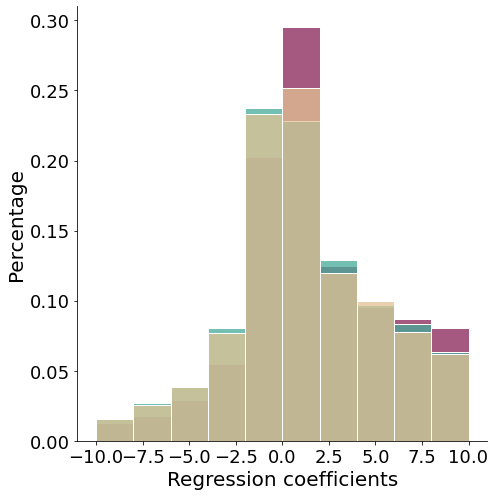

In [3]:
from plots import plot_cue_validity
feature_coef = plot_cue_validity(data)

In [24]:
feature_coef[:, 0].sort()
feature_coef[:, 1].sort()
feature_coef[:, 2].sort()

In [25]:
feature_coef

array([[-64427.01137581,  -6021.31317315,  -5229.47405493],
       [-15338.24872572,  -5764.50417453,  -1824.53868037],
       [-10841.69510316,  -5429.15447619,  -1668.18933176],
       ...,
       [  1830.99465231,   5588.93971013,   9896.20490284],
       [  3220.44403603,   5813.30258791,  11456.81598658],
       [  5102.44043511,   6839.81091537,  31388.51730478]])

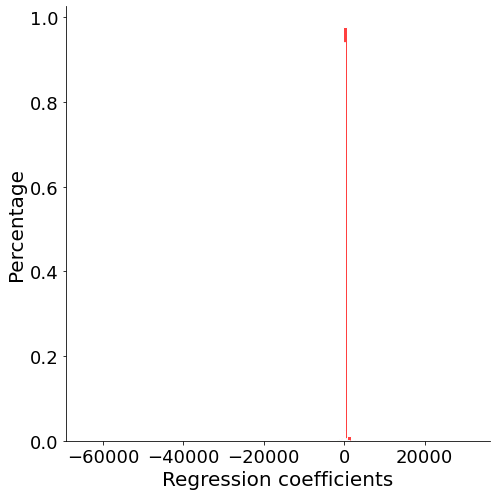

In [15]:
f, ax = plt.subplots(1, 1, figsize=(7,7))
for i in range(feature_coef.shape[1]):
    sns.histplot(feature_coef[:, i], ax=ax, bins=100, stat='probability', edgecolor='w', linewidth=1, color=['r', 'g', 'b'][i])
ax.set_xlabel('Regression coefficients', fontsize=FONTSIZE)
ax.set_ylabel('Percentage', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE-2)
plt.yticks(fontsize=FONTSIZE-2)
sns.despine()
f.tight_layout()
plt.show()

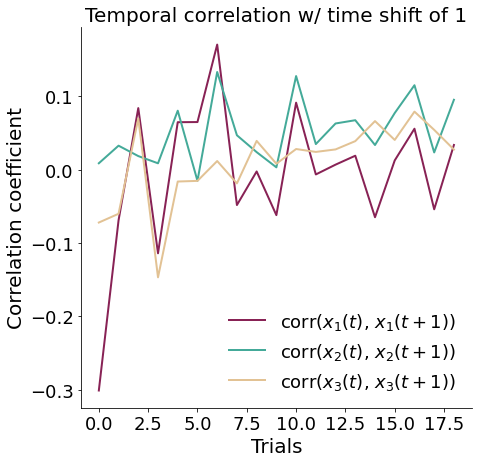

In [17]:
from plots import plot_correlation_features
plot_correlation_features(data, max_input_length=211, time_shift=1)

/raven/u/ajagadish/vanilla-llama/categorisation/plots.py:264: RuntimeWarning: Mean of empty slice
  dists, probs = np.nanmean(distances,0), np.nanmean(probabilities, 0)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


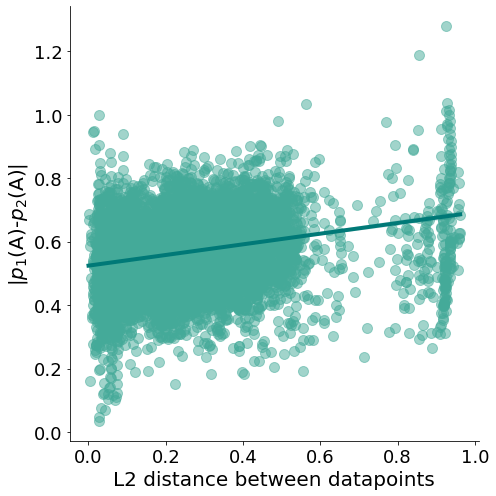

In [18]:
from plots import plot_probability_same_class_versus_distance
plot_probability_same_class_versus_distance(data)